# SegNet Segmentation




In [1]:
# import modules (download with pip install first if not on local. Type on terminal: pip install <module name>)
import torch
import torch.nn as nn
import torch.nn.functional as F #contains some useful functions like activation functions & convolution operations you can use
import numpy as np
import os

# install torchvision first

device = torch.device("cuda: 0" if torch.cuda.is_available() else "cpu")
print("Using",device,"...")

Using cpu ...


## Dataset

In [2]:
from load_data import *
# X, y = load_data('/content/drive/My Drive/AIWIRE', 'dataset')
# X, y = load_data('.', 'small_dataset')
X, y = load_data('.', '../data/iteration_1_dataset')

In [3]:
import dataset

from imgaug import augmenters as iaa 
from sklearn.model_selection import train_test_split
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

batch_size = 50
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
dataloaders = dataset.gen_dataloaders(X_train, X_test, y_train, y_test, batch_size)

# Initialize augmentation types 
seq = iaa.Sequential([
    iaa.Sometimes(0.7,
                  iaa.Fliplr(0.5)),
    iaa.Sometimes(0.4,
        iaa.Affine(
        scale = {"x": (0.8,1.2), "y": (0.8,1.2)},
        rotate = (-5,5)
        )
    )
])

# Function that applies augmentation to batch during training
def apply_augmentation(image,mask):
    
    ims_aug=torch.zeros([len(image),1,image.shape[2],image.shape[3]],dtype=torch.float64)
    mask_aug=torch.zeros([len(mask),mask.shape[1],mask.shape[2]],dtype=torch.float64)
    
    for i in range(len(image)): 
        segmap = np.squeeze(mask[i].numpy())
        segmap = SegmentationMapsOnImage(segmap,shape=image.shape)
        im,gt = seq(images=np.squeeze(image[i].numpy()),segmentation_maps=segmap)
        gt = gt.get_arr().astype(float)
        im,gt = torch.from_numpy(im),torch.from_numpy(gt)
        ims_aug[i,0] = im
        mask_aug[i] = gt
        
    return ims_aug, mask_aug 

{'train': 1600, 'val': 400}


In [4]:
from scipy.ndimage import gaussian_filter

def norm(im):
    im -= im.min()
    im = im / im.max()
    return im

def weighted_BCE(weights=None):
    def weighted_binary_cross_entropy(output, target):
        if weights is not None:
            assert len(weights) == 2

            loss = weights[1] * (target * torch.log(output)) + \
                   weights[0] * ((1 - target) * torch.log(1 - output))
        else:
            loss = target * torch.log(output) + (1 - target) * torch.log(1 - output)

        return torch.neg(torch.mean(loss))
    return weighted_binary_cross_entropy

torch.Size([128, 64])
torch.Size([8192, 1])
Showing images
torch.Size([1, 128, 64]) torch.Size([1, 128, 64])
Class balance (one sigma): 2.099609375%
Loss for null model: 0.06603105698354739


C:\Users\noonp\Anaconda3\envs\python3.6\lib\site-packages\imgaug\imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)


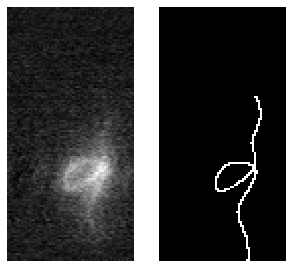

torch.Size([1, 128, 64]) torch.Size([1, 128, 64])
Class balance (one sigma): 2.81982421875%
Loss for null model: 0.0824182007262948


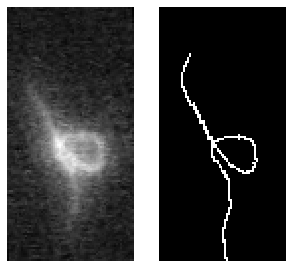

torch.Size([1, 128, 64]) torch.Size([1, 128, 64])
Class balance (one sigma): 2.06298828125%
Loss for null model: 0.06515255913836882


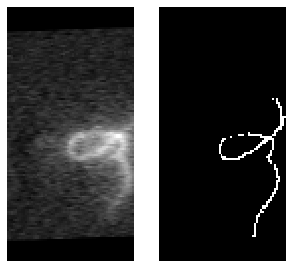

In [5]:
import matplotlib.pyplot as plt

# loss_function = nn.MSELoss()
class_weighting_multiplier = 3/4
loss_function = weighted_BCE(weights = torch.Tensor([1 - class_weighting_multiplier, class_weighting_multiplier]))
# loss_function = weighted_BCE(weights = torch.Tensor([0, 1]))
def show(im):
    plt.imshow(im, cmap='gray')
    plt.axis('off')

    
print(dataloaders['train'])
n = 3
first_batch = next(iter(dataloaders['train']))

ims = first_batch[0][:n]
gts = first_batch[1][:n].float()
# gts = first_batch[1][:n].numpy()

print(gts[0].shape)
print(gts[0].reshape(-1,1).shape)
# h2 = plt.hist(gts[0].reshape(-1,1), bins = 40, density = True, alpha=1)
# plt.show()
# h2 = plt.hist(ims[0].numpy().reshape(-1,1), bins = 40, density = True, alpha=1)
# plt.show()

print('Showing images')
for [im], gt in zip(ims, gts):
    segmap = gt.numpy()
    segmap = SegmentationMapsOnImage(segmap,shape=im.shape)
    im,gt = seq(images=im.numpy(),segmentation_maps=segmap)
    gt = gt.get_arr().astype(float)
    im,gt = torch.from_numpy(im),torch.from_numpy(gt)
    plt.figure(figsize=[5]*2)
    plt.subplot(121)
    show(im)

    plt.subplot(122)
    show(gt)
#     one_hot_gt = one_hot_encode(gt)
#     print(one_hot_gt.shape)
    print(torch.Tensor(np.ones(gt.shape) * np.average(gt)).unsqueeze(0).shape, gt.unsqueeze(0).shape)
    base_loss = loss_function(torch.Tensor(np.ones(gt.shape) * np.average(gt)).unsqueeze(0), gt.unsqueeze(0))
    print(f'Class balance (one sigma): {100 * torch.sum((gt - np.std(gt.numpy())) > 0).item() / np.prod(gt.shape)}%')
    print('Loss for null model:', base_loss.item())
    
    plt.show()

## Model

In [9]:
# Get a batch of training data
inputs, masks = next(iter(dataloaders['train']))

print(inputs.shape, masks.shape)
print(inputs.dtype, masks.dtype)

for x in [inputs.numpy(), masks.numpy()]:
    print(x.min(), x.max(), x.mean(), x.std())

# install torchsummary first
from torchsummary import summary
# import model from python file
import Segnet
import importlib
importlib.reload(Segnet)

num_class = 1
model = Segnet.SegNet(num_class)
model = model.to(device)
print(model.type)
print("MODEL ARCHITECTURE ...")
summary(model, input_size=(1,128,64))

save_path = 'saved_models/model_thin.pth'

torch.Size([50, 1, 128, 64]) torch.Size([50, 128, 64])
torch.float64 torch.float64
0.00022069797606562162 1.0 0.20953057367070027 0.14204832709767085
0.0 1.0 0.02039306640625 0.14134068504432923
<bound method Module.type of SegNet(
  (model): Sequential(
    (0): Conv2d(1, 4, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(4, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): Conv2d(32, 64, kerne

## Training

In [10]:
from torch.utils.tensorboard import SummaryWriter
import datetime
writer = SummaryWriter('./logs/{0}',format(datetime.datetime.now().strftime('%Y-%m-%d,%H:%M:%S')))
import matplotlib.gridspec as gridspec


import matplotlib.pyplot as plt
def visualise(outputs, title, n=7):
    fig = plt.figure(figsize=[10, 3])
    fig.suptitle(title, fontsize=14)
    for i, output in enumerate(outputs[:n]):
        plt.subplot(1,n,i+1)
        plt.axis('off')
        plt.imshow(output) if output.shape[0] == 3 else plt.imshow(output, cmap='gray')
    plt.show()

Epoch 0/99
----------
LR 0.005


C:\Users\noonp\Anaconda3\envs\python3.6\lib\site-packages\imgaug\imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)


Batch 0 : 0.24398136138916016
Batch 10 : 0.19918546080589294
Batch 20 : 0.1922297328710556
Batch 30 : 0.18553896248340607
Loss train : 0.19791916
Batch 0 : 0.18529562652111053
Loss val : 0.18558286


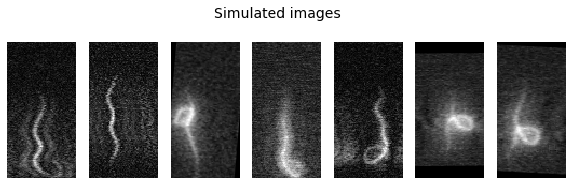

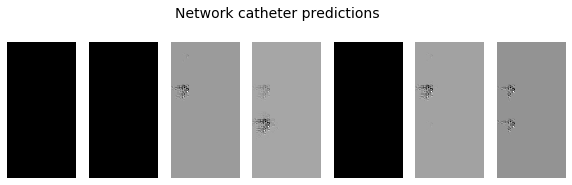

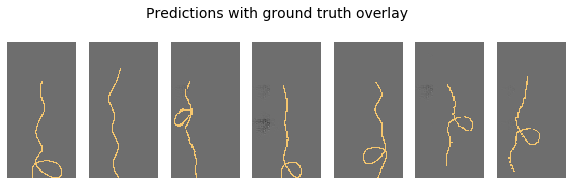

saving best model
0m 25s
Epoch 1/99
----------
LR 0.005
Batch 0 : 0.18334968388080597
Batch 10 : 0.1696814000606537
Batch 20 : 0.13241784274578094
Batch 30 : 0.08116302639245987
Loss train : 0.14302637
Batch 0 : 0.08905384689569473
Loss val : 0.08779925


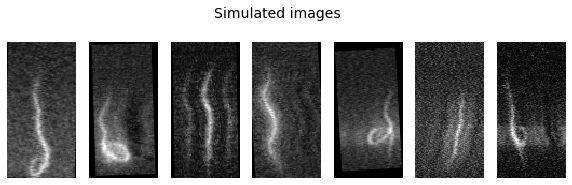

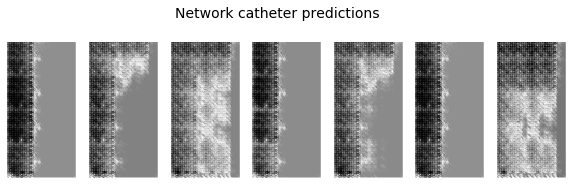

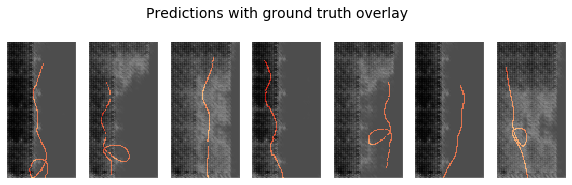

saving best model
0m 21s
Epoch 2/99
----------
LR 0.005
Batch 0 : 0.07508116960525513
Batch 10 : 0.05768878385424614
Batch 20 : 0.05239551514387131
Batch 30 : 0.0496908538043499
Loss train : 0.05691405
Batch 0 : 0.05008130148053169
Loss val : 0.05108034


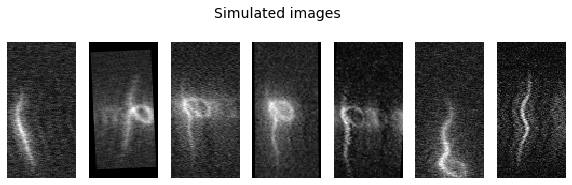

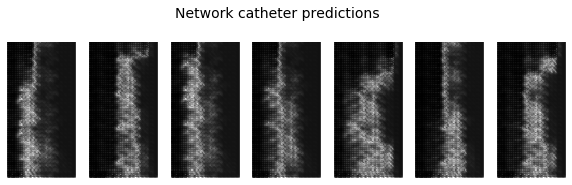

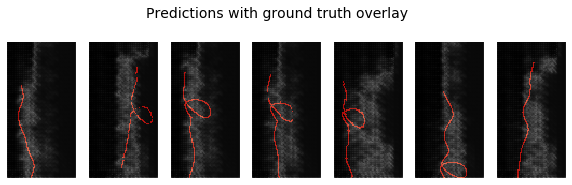

saving best model
0m 23s
Epoch 3/99
----------
LR 0.005
Batch 0 : 0.04758095741271973
Batch 10 : 0.04568136855959892
Batch 20 : 0.04579785466194153
Batch 30 : 0.04343808814883232
Loss train : 0.04668905
Batch 0 : 0.04595532268285751
Loss val : 0.04648617


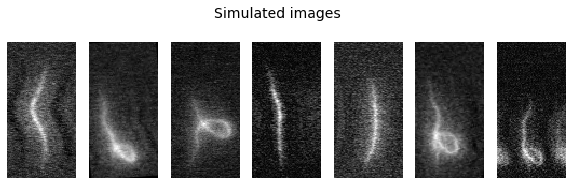

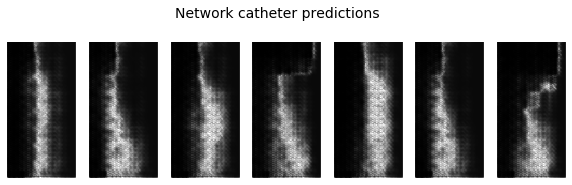

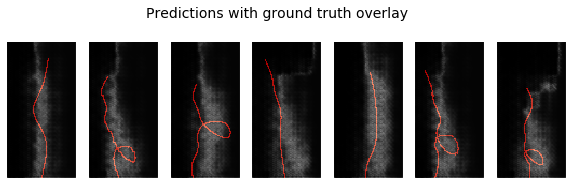

saving best model
0m 35s
Epoch 4/99
----------
LR 0.005
Batch 0 : 0.043286532163619995
Batch 10 : 0.04215829074382782
Batch 20 : 0.040894217789173126
Batch 30 : 0.04094184935092926
Loss train : 0.04266155
Batch 0 : 0.04304627329111099
Loss val : 0.04197359


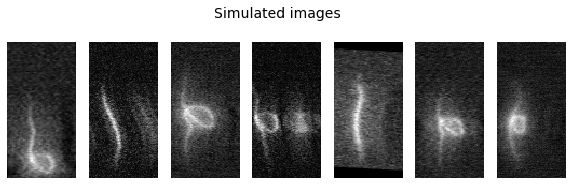

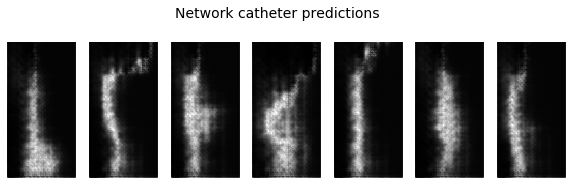

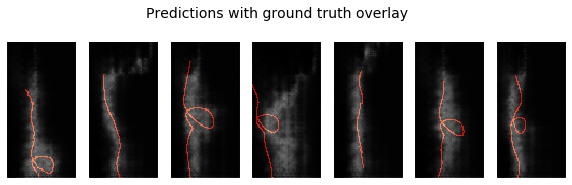

saving best model
0m 28s
Epoch 5/99
----------
LR 0.005
Batch 0 : 0.04076206311583519
Batch 10 : 0.04147971048951149
Batch 20 : 0.037577539682388306
Batch 30 : 0.03696624934673309
Loss train : 0.03898099
Batch 0 : 0.0386781245470047
Loss val : 0.03855764


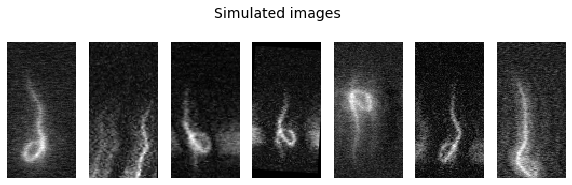

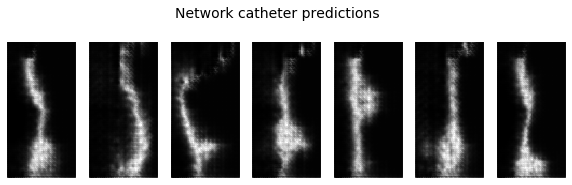

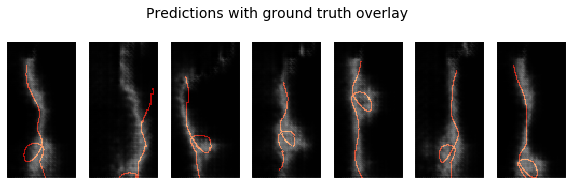

saving best model
0m 28s
Epoch 6/99
----------
LR 0.005
Batch 0 : 0.03862721472978592
Batch 10 : 0.03861204534769058
Batch 20 : 0.0363226942718029
Batch 30 : 0.03563165292143822
Loss train : 0.03644872
Batch 0 : 0.03480406105518341
Loss val : 0.03643056


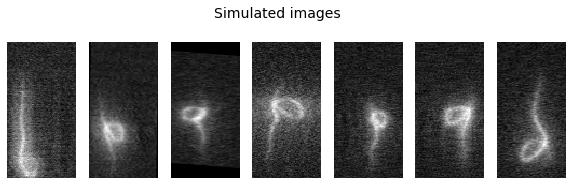

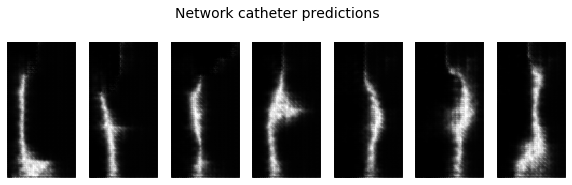

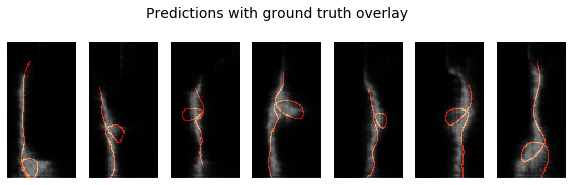

saving best model
0m 27s
Epoch 7/99
----------
LR 0.005
Batch 0 : 0.03855368494987488
Batch 10 : 0.03331886604428291
Batch 20 : 0.03488651290535927
Batch 30 : 0.031571611762046814
Loss train : 0.03478590
Batch 0 : 0.033444955945014954
Loss val : 0.03508426


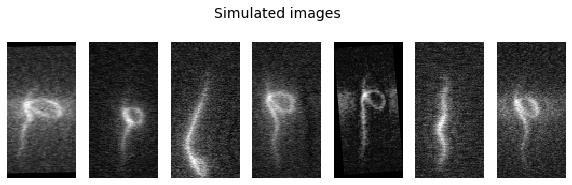

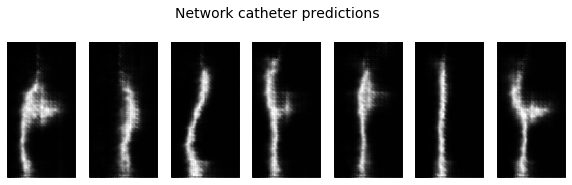

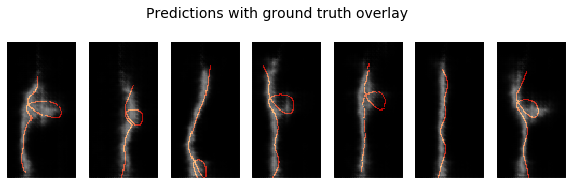

saving best model
0m 29s
Epoch 8/99
----------
LR 0.005
Batch 0 : 0.03508547693490982
Batch 10 : 0.03334464877843857
Batch 20 : 0.03441779315471649
Batch 30 : 0.03318166360259056
Loss train : 0.03262744
Batch 0 : 0.03263707086443901
Loss val : 0.03293979


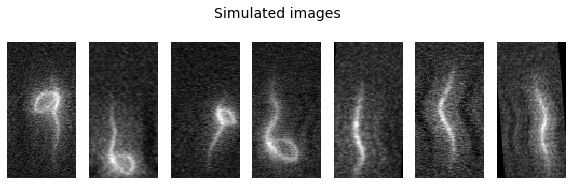

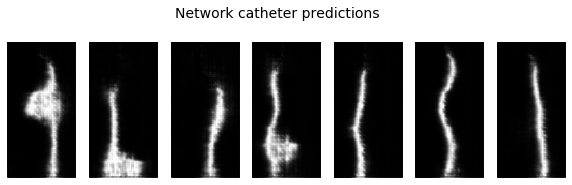

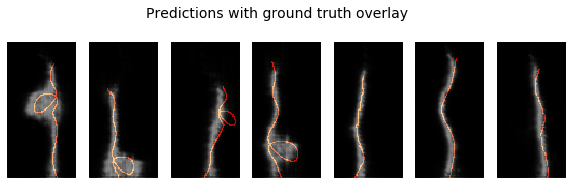

saving best model
0m 27s
Epoch 9/99
----------
LR 0.005
Batch 0 : 0.030091172084212303
Batch 10 : 0.03152122348546982
Batch 20 : 0.032710060477256775
Batch 30 : 0.03159603103995323
Loss train : 0.03213479
Batch 0 : 0.02941436693072319
Loss val : 0.03087712


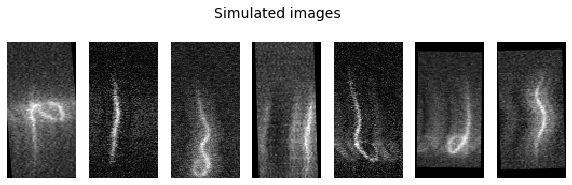

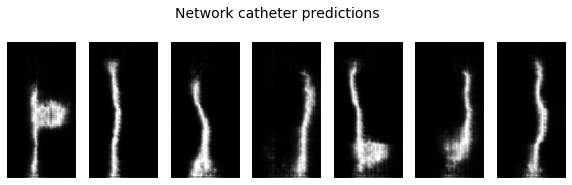

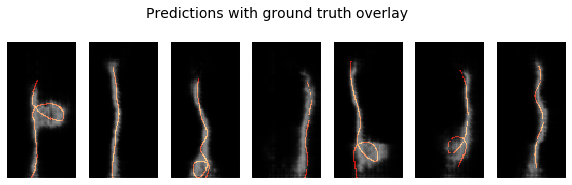

saving best model
0m 27s
Epoch 10/99
----------
LR 0.005
Batch 0 : 0.03277954086661339
Batch 10 : 0.029026513919234276
Batch 20 : 0.02963564358651638
Batch 30 : 0.029662679880857468
Loss train : 0.03097355
Batch 0 : 0.030125487595796585
Loss val : 0.03030656


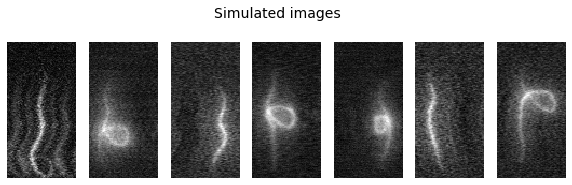

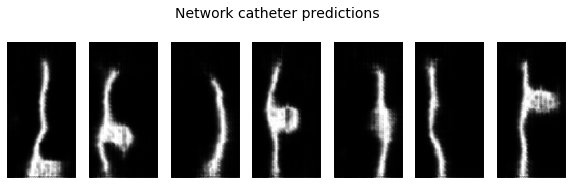

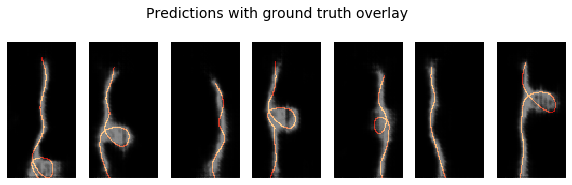

saving best model
0m 27s
Epoch 11/99
----------
LR 0.005
Batch 0 : 0.030058667063713074
Batch 10 : 0.029372887685894966
Batch 20 : 0.030279837548732758
Batch 30 : 0.027268825098872185
Loss train : 0.03023274
Batch 0 : 0.03012464940547943
Loss val : 0.02972354


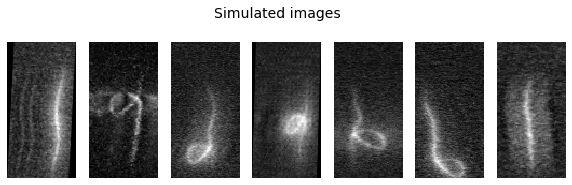

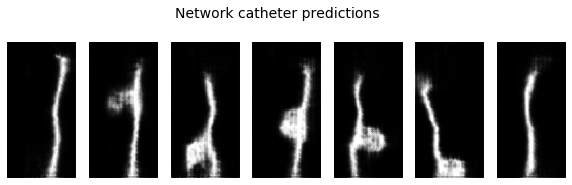

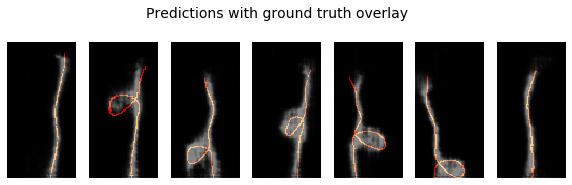

saving best model
0m 29s
Epoch 12/99
----------
LR 0.005
Batch 0 : 0.02829187922179699
Batch 10 : 0.027527283877134323
Batch 20 : 0.028907466679811478
Batch 30 : 0.030896544456481934
Loss train : 0.02900239
Batch 0 : 0.03004603087902069
Loss val : 0.02946334


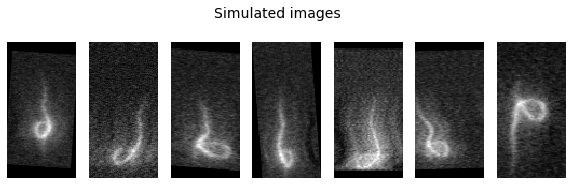

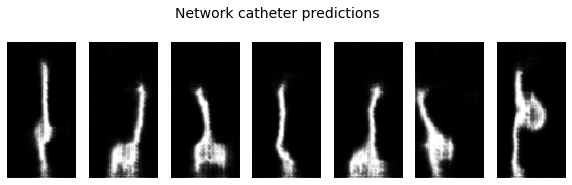

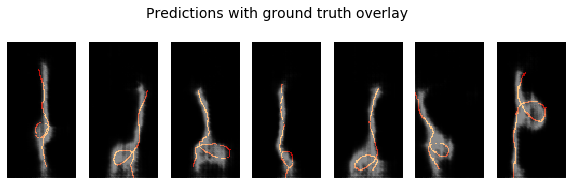

saving best model
0m 27s
Epoch 13/99
----------
LR 0.005
Batch 0 : 0.029783401638269424
Batch 10 : 0.030334550887346268
Batch 20 : 0.027757378295063972
Batch 30 : 0.028345609083771706
Loss train : 0.02866033
Batch 0 : 0.028337880969047546
Loss val : 0.02870514


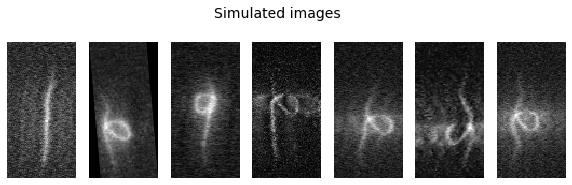

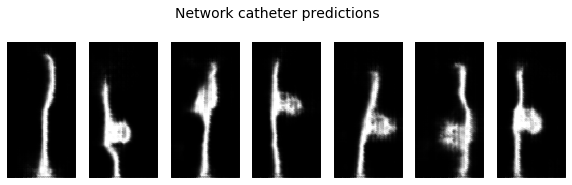

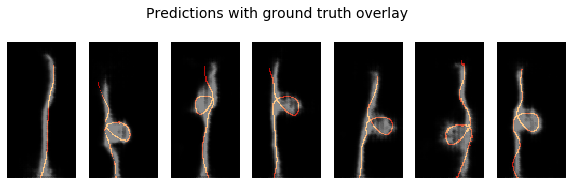

saving best model
0m 27s
Epoch 14/99
----------
LR 0.005
Batch 0 : 0.02682136930525303
Batch 10 : 0.02964174747467041
Batch 20 : 0.028865722939372063
Batch 30 : 0.028320083394646645
Loss train : 0.02848011
Batch 0 : 0.02897147834300995
Loss val : 0.02880249


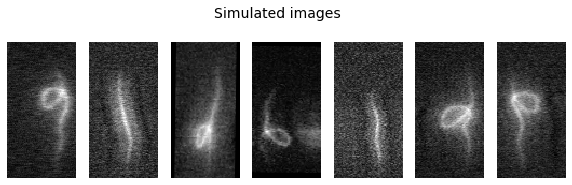

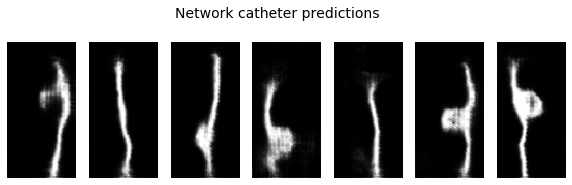

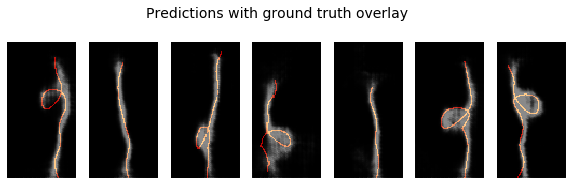

0m 26s
Epoch 15/99
----------
LR 0.005
Batch 0 : 0.02842521481215954
Batch 10 : 0.026702100411057472
Batch 20 : 0.02735787443816662
Batch 30 : 0.02742060460150242
Loss train : 0.02770813
Batch 0 : 0.027840061113238335
Loss val : 0.02823070


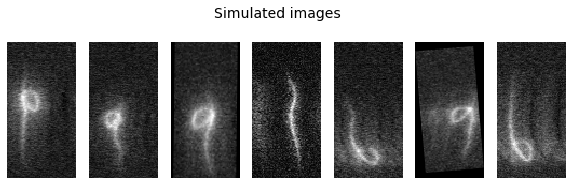

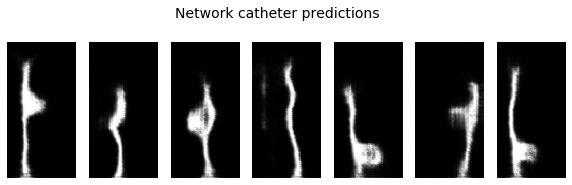

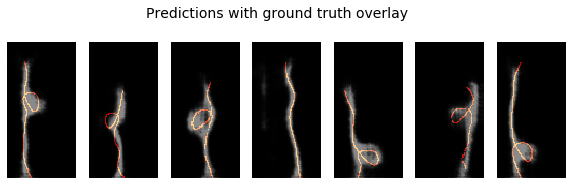

saving best model
0m 26s
Epoch 16/99
----------
LR 0.005
Batch 0 : 0.02784026227891445
Batch 10 : 0.025833601132035255
Batch 20 : 0.02730218693614006
Batch 30 : 0.026278922334313393
Loss train : 0.02747231
Batch 0 : 0.02890831232070923
Loss val : 0.02833033


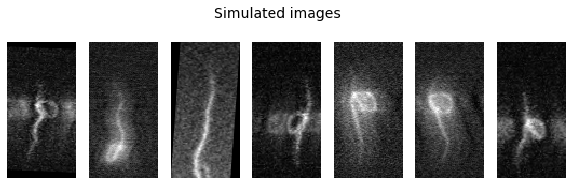

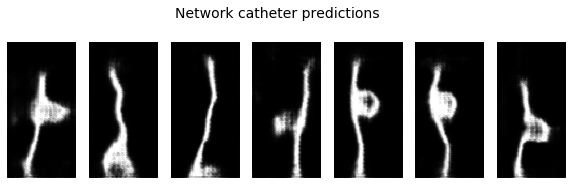

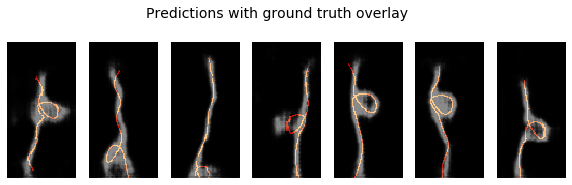

0m 30s
Epoch 17/99
----------
LR 0.005
Batch 0 : 0.026623796671628952
Batch 10 : 0.025728220120072365
Batch 20 : 0.028798265382647514
Batch 30 : 0.026969652622938156
Loss train : 0.02722478
Batch 0 : 0.028779935091733932
Loss val : 0.02730729


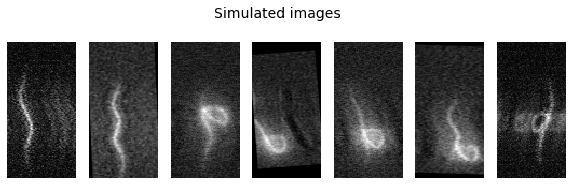

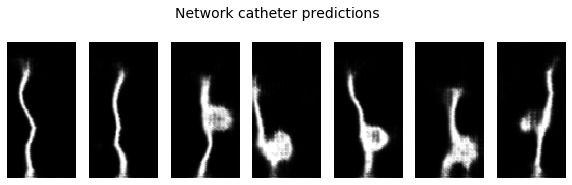

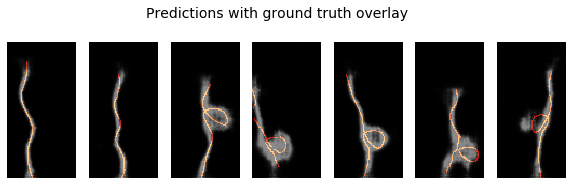

saving best model
0m 26s
Epoch 18/99
----------
LR 0.005
Batch 0 : 0.028247937560081482
Batch 10 : 0.02602456323802471
Batch 20 : 0.027229003608226776
Batch 30 : 0.026181958615779877
Loss train : 0.02679036
Batch 0 : 0.02765137143433094
Loss val : 0.02806015


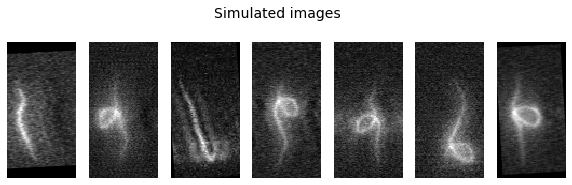

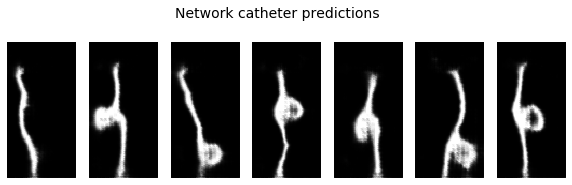

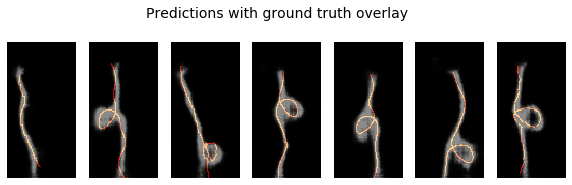

0m 25s
Epoch 19/99
----------
LR 0.005
Batch 0 : 0.02762187272310257
Batch 10 : 0.02584552951157093
Batch 20 : 0.02629244141280651
Batch 30 : 0.026171822100877762
Loss train : 0.02614537
Batch 0 : 0.02622205764055252
Loss val : 0.02661730


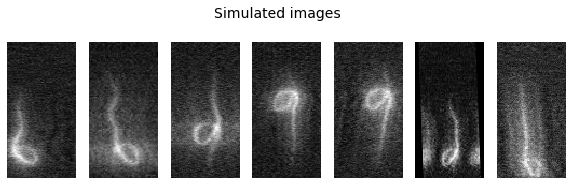

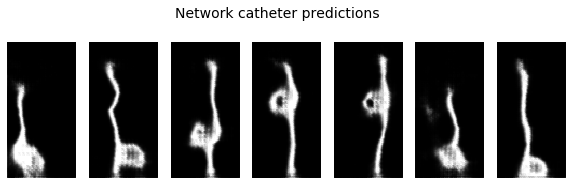

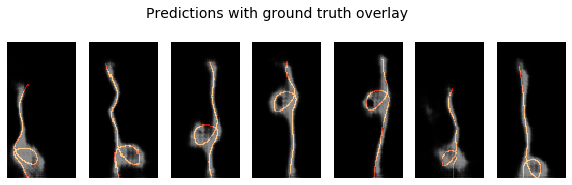

saving best model
0m 25s
Epoch 20/99
----------
LR 0.005
Batch 0 : 0.02530006319284439
Batch 10 : 0.024980731308460236
Batch 20 : 0.025939621031284332
Batch 30 : 0.02881624922156334
Loss train : 0.02634692
Batch 0 : 0.02521299198269844
Loss val : 0.02698345


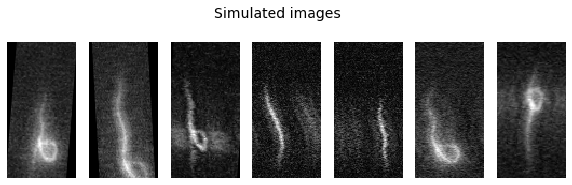

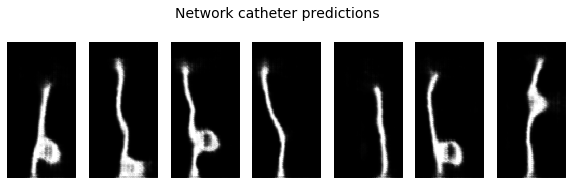

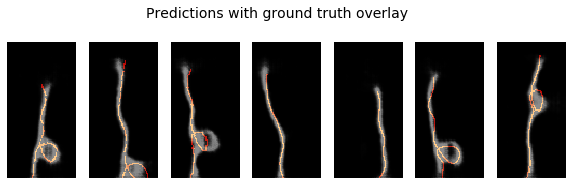

0m 27s
Epoch 21/99
----------
LR 0.005
Batch 0 : 0.02620585635304451
Batch 10 : 0.024725545197725296
Batch 20 : 0.025627151131629944
Batch 30 : 0.02684640884399414
Loss train : 0.02602532
Batch 0 : 0.027634765952825546
Loss val : 0.02664568


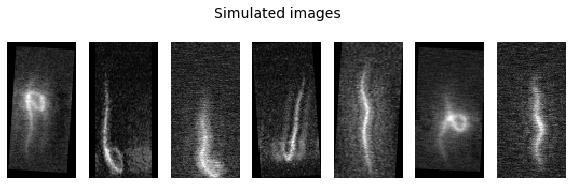

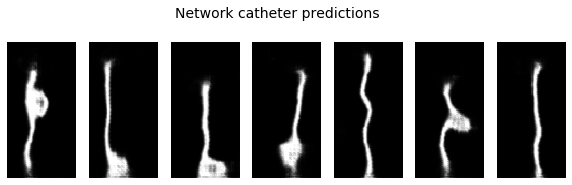

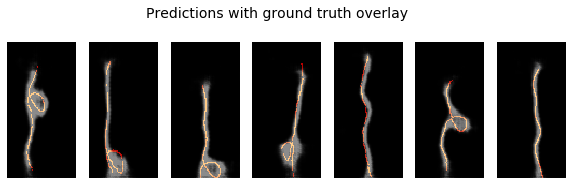

0m 26s
Epoch 22/99
----------
LR 0.005
Batch 0 : 0.02537226676940918
Batch 10 : 0.02462102472782135
Batch 20 : 0.024960681796073914
Batch 30 : 0.025640301406383514
Loss train : 0.02572231
Batch 0 : 0.027150845155119896
Loss val : 0.02691945


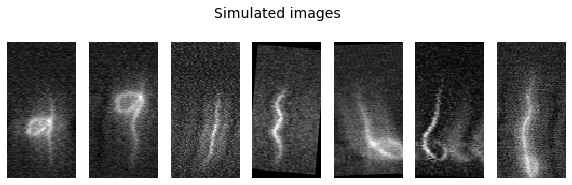

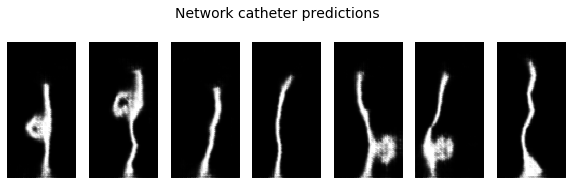

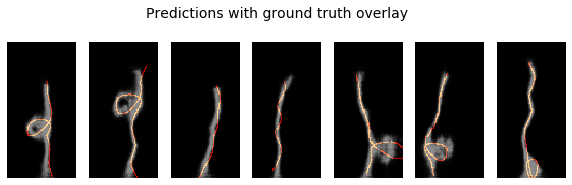

0m 26s
Epoch 23/99
----------
LR 0.005
Batch 0 : 0.025878818705677986
Batch 10 : 0.025976186618208885
Batch 20 : 0.02395656891167164
Batch 30 : 0.025500835850834846
Loss train : 0.02571264
Batch 0 : 0.027182307094335556
Loss val : 0.02660342


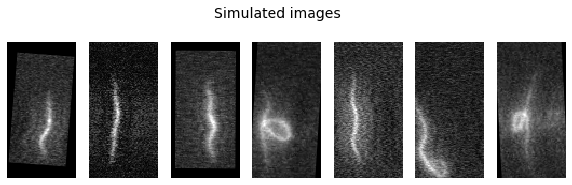

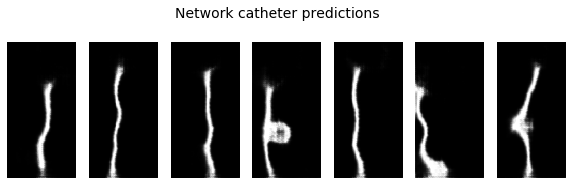

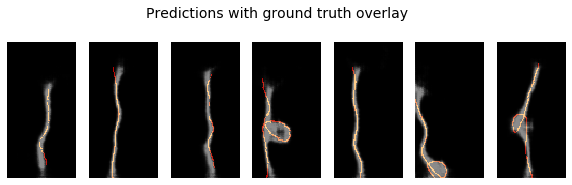

saving best model
0m 26s
Epoch 24/99
----------
LR 0.005
Batch 0 : 0.024877499788999557
Batch 10 : 0.0252766702324152
Batch 20 : 0.02458789572119713
Batch 30 : 0.024329185485839844
Loss train : 0.02531034
Batch 0 : 0.026290887966752052
Loss val : 0.02617194


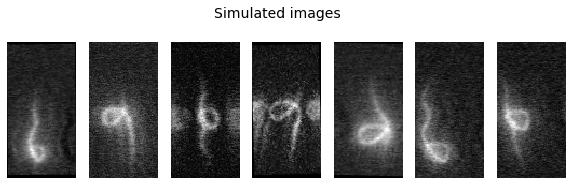

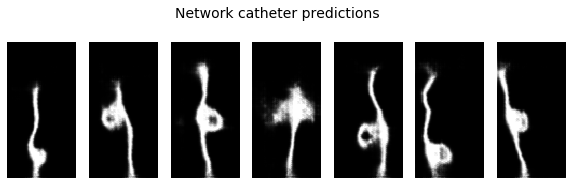

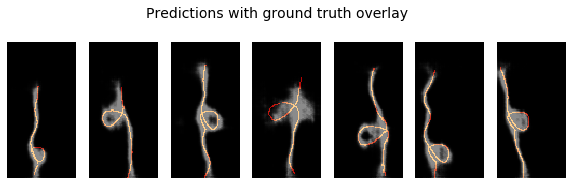

saving best model
0m 26s
Epoch 25/99
----------
LR 0.005
Batch 0 : 0.025003252550959587
Batch 10 : 0.025585884228348732
Batch 20 : 0.025044288486242294
Batch 30 : 0.024746503680944443
Loss train : 0.02516004
Batch 0 : 0.02529185451567173
Loss val : 0.02574219


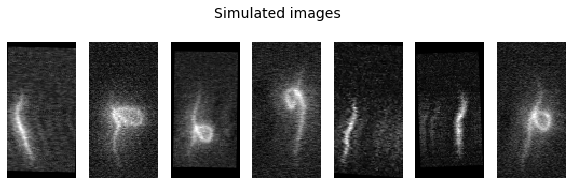

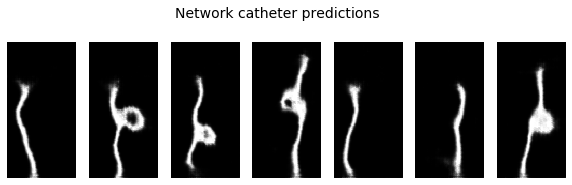

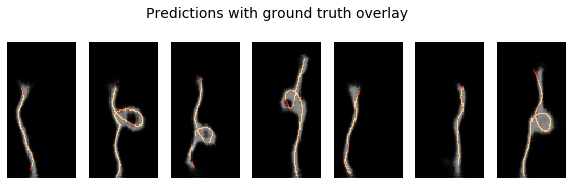

saving best model
0m 28s
Epoch 26/99
----------
LR 0.005
Batch 0 : 0.025803156197071075
Batch 10 : 0.023768041282892227
Batch 20 : 0.024861633777618408
Batch 30 : 0.025793705135583878
Loss train : 0.02513856
Batch 0 : 0.028203921392560005
Loss val : 0.02599968


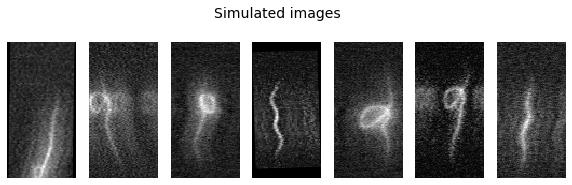

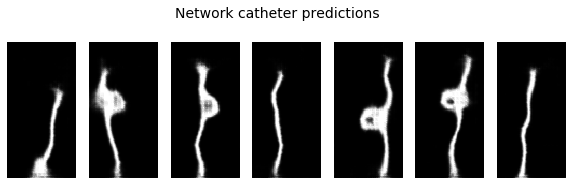

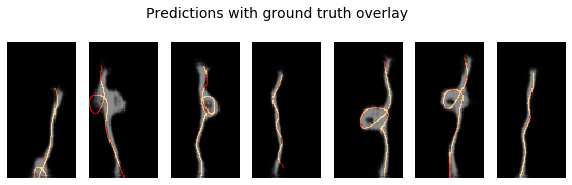

0m 26s
Epoch 27/99
----------
LR 0.005
Batch 0 : 0.025454044342041016
Batch 10 : 0.025911670178174973
Batch 20 : 0.025496790185570717
Batch 30 : 0.02543589100241661
Loss train : 0.02536104
Batch 0 : 0.027378635480999947
Loss val : 0.02609665


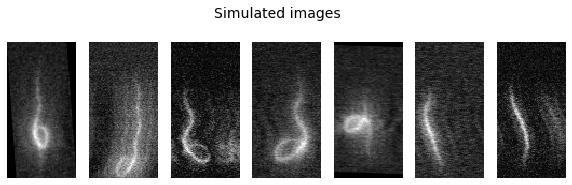

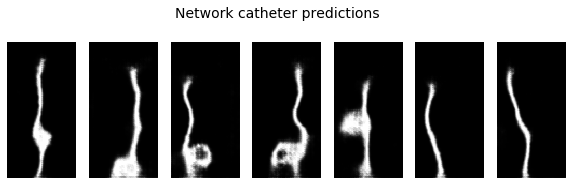

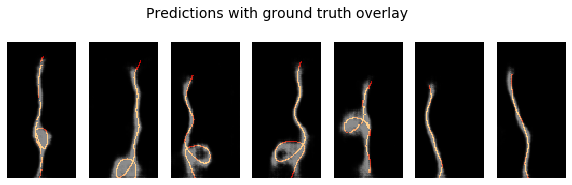

0m 26s
Epoch 28/99
----------
LR 0.005
Batch 0 : 0.024258356541395187
Batch 10 : 0.024521760642528534
Batch 20 : 0.02472817339003086
Batch 30 : 0.024455992504954338
Loss train : 0.02468679
Batch 0 : 0.024474244564771652
Loss val : 0.02562902


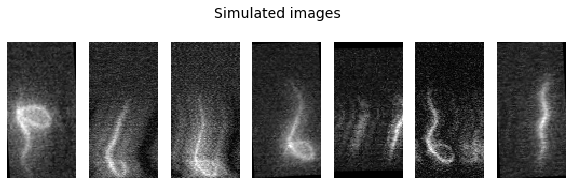

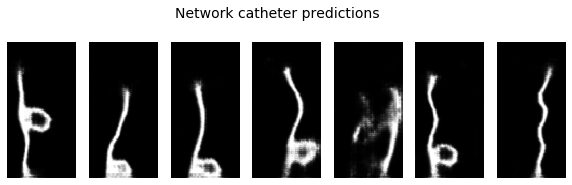

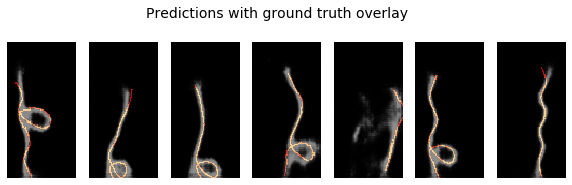

saving best model
0m 26s
Epoch 29/99
----------
LR 0.005
Batch 0 : 0.024226345121860504
Batch 10 : 0.025170885026454926
Batch 20 : 0.024138255044817924
Batch 30 : 0.024560265243053436
Loss train : 0.02467014
Batch 0 : 0.026135385036468506
Loss val : 0.02526561


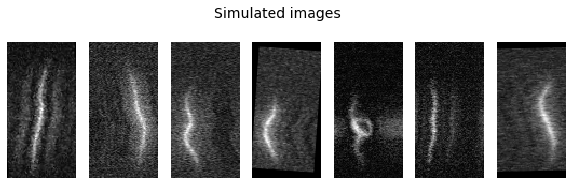

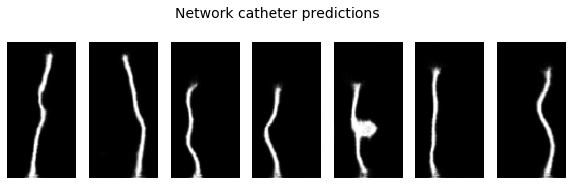

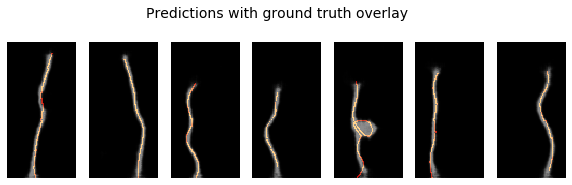

saving best model
0m 27s
Epoch 30/99
----------
LR 0.005
Batch 0 : 0.02515053190290928
Batch 10 : 0.023890851065516472
Batch 20 : 0.024729523807764053
Batch 30 : 0.0248815156519413
Loss train : 0.02434498
Batch 0 : 0.026433952152729034
Loss val : 0.02557080


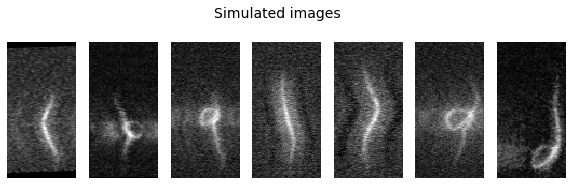

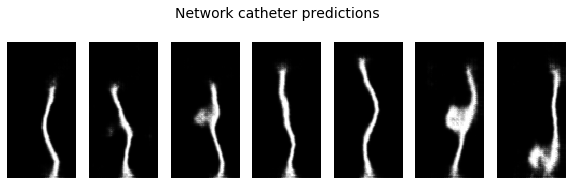

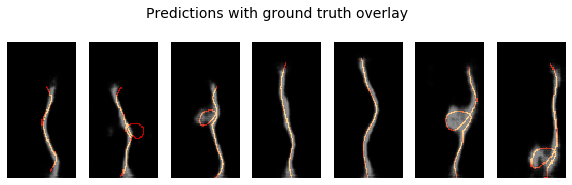

0m 27s
Epoch 31/99
----------
LR 0.005
Batch 0 : 0.023512011393904686
Batch 10 : 0.02329643815755844
Batch 20 : 0.023706810548901558
Batch 30 : 0.02591121755540371
Loss train : 0.02431410
Batch 0 : 0.023988027125597
Loss val : 0.02535623


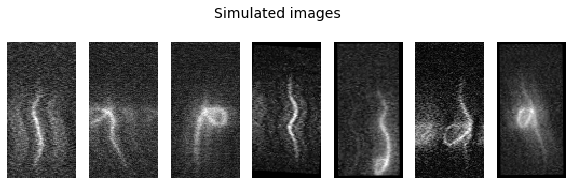

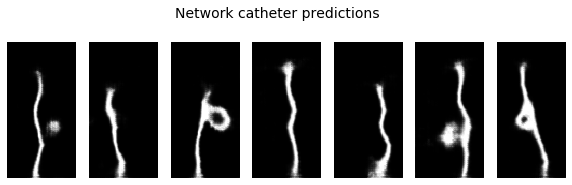

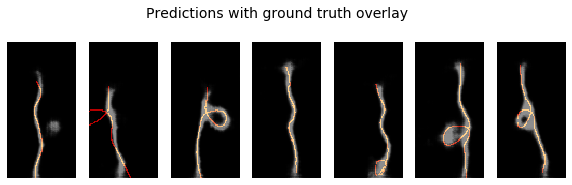

0m 24s
Epoch 32/99
----------
LR 0.005
Batch 0 : 0.024046065285801888
Batch 10 : 0.024011120200157166
Batch 20 : 0.02382405288517475
Batch 30 : 0.023921972140669823
Loss train : 0.02434322
Batch 0 : 0.025030726566910744
Loss val : 0.02532602


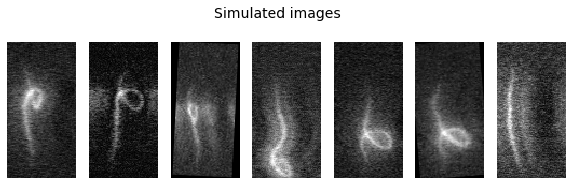

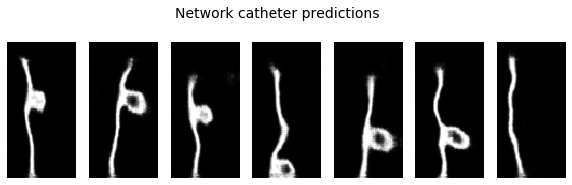

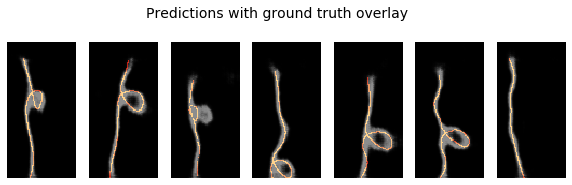

0m 24s
Epoch 33/99
----------
LR 0.005
Batch 0 : 0.025554247200489044
Batch 10 : 0.024394845589995384
Batch 20 : 0.024150973185896873
Batch 30 : 0.02379602938890457
Loss train : 0.02386271
Batch 0 : 0.02500259317457676
Loss val : 0.02535705


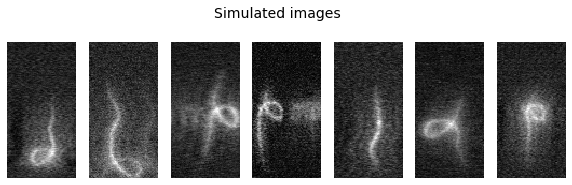

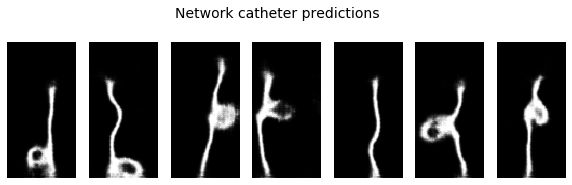

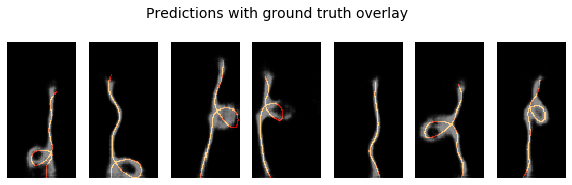

0m 26s
Epoch 34/99
----------
LR 0.005
Batch 0 : 0.023838162422180176
Batch 10 : 0.023343529552221298
Batch 20 : 0.023075466975569725
Batch 30 : 0.024388600140810013
Loss train : 0.02370781
Batch 0 : 0.024972056970000267
Loss val : 0.02468481


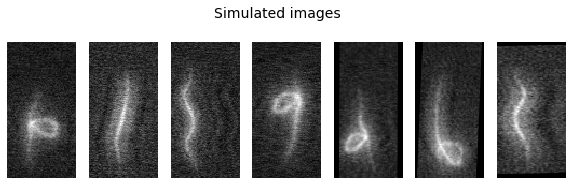

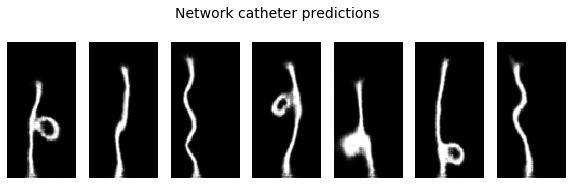

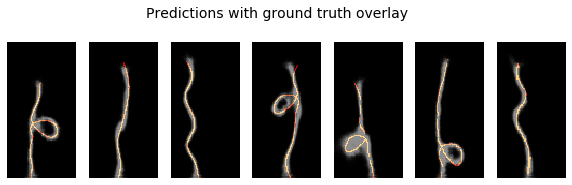

saving best model
0m 27s
Epoch 35/99
----------
LR 0.005
Batch 0 : 0.025164766237139702
Batch 10 : 0.023646604269742966
Batch 20 : 0.02395746298134327
Batch 30 : 0.02341497875750065
Loss train : 0.02388339
Batch 0 : 0.022867493331432343
Loss val : 0.02456731


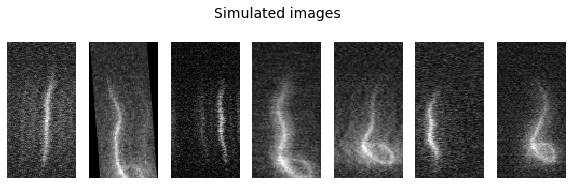

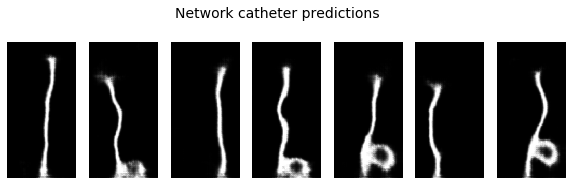

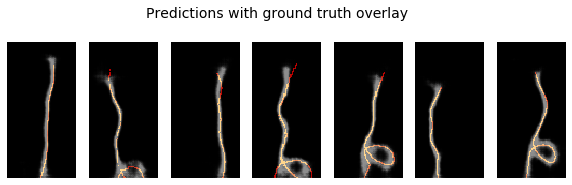

saving best model
0m 28s
Epoch 36/99
----------
LR 0.005
Batch 0 : 0.02367575094103813
Batch 10 : 0.022822659462690353
Batch 20 : 0.026719560846686363
Batch 30 : 0.02422398142516613
Loss train : 0.02391846
Batch 0 : 0.025510640814900398
Loss val : 0.02479593


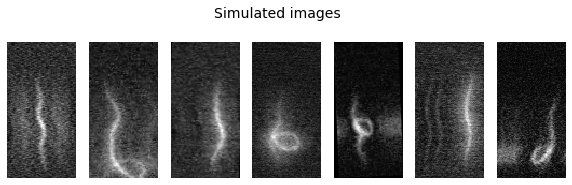

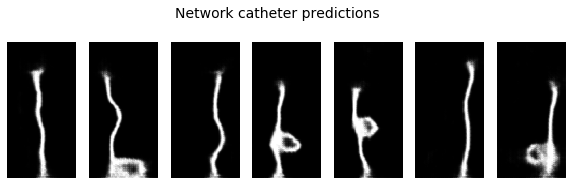

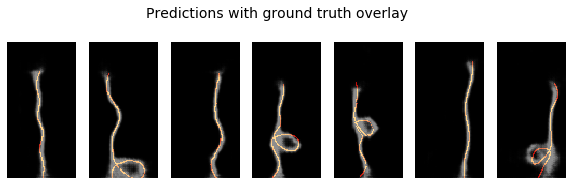

0m 27s
Epoch 37/99
----------
LR 0.005
Batch 0 : 0.02305016666650772
Batch 10 : 0.024005446583032608
Batch 20 : 0.022998178377747536
Batch 30 : 0.024188533425331116
Loss train : 0.02372706
Batch 0 : 0.024618539959192276
Loss val : 0.02480885


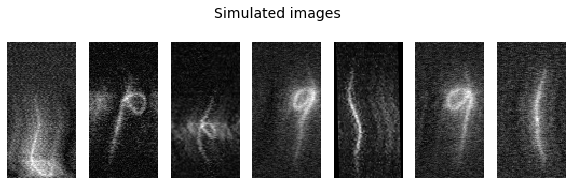

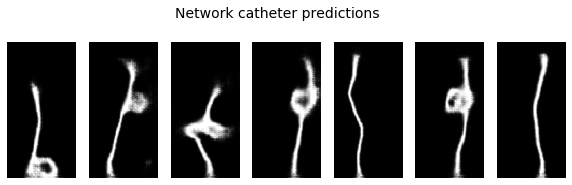

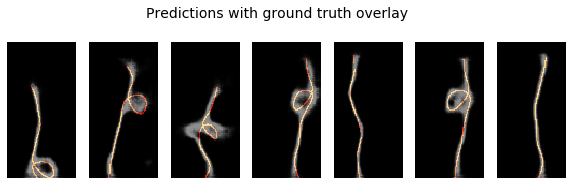

0m 25s
Epoch 38/99
----------
LR 0.005
Batch 0 : 0.02378624863922596
Batch 10 : 0.022751903161406517
Batch 20 : 0.02356511354446411
Batch 30 : 0.02254539541900158
Loss train : 0.02354123
Batch 0 : 0.025173000991344452
Loss val : 0.02467096


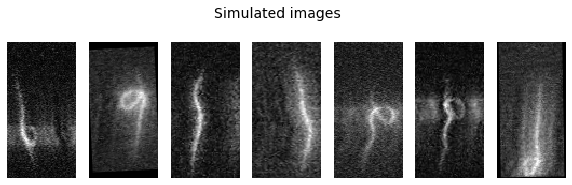

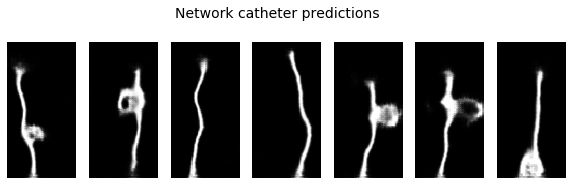

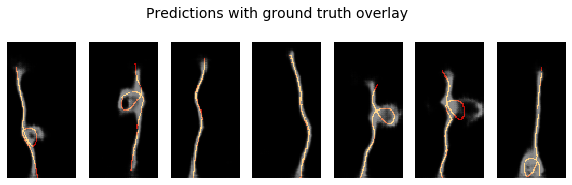

0m 29s
Epoch 39/99
----------
LR 0.005
Batch 0 : 0.02354796975851059
Batch 10 : 0.02258921228349209
Batch 20 : 0.024091053754091263
Batch 30 : 0.023434052243828773
Loss train : 0.02300859
Batch 0 : 0.023200921714305878
Loss val : 0.02413153


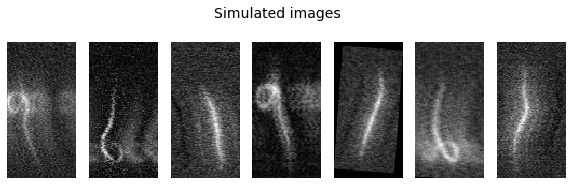

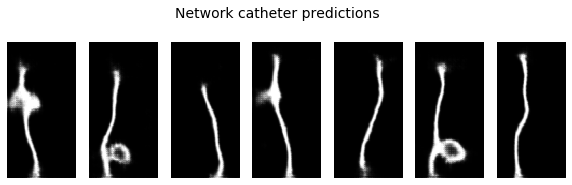

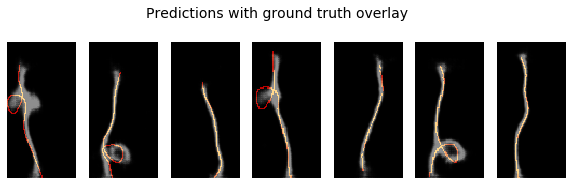

saving best model
0m 23s
Epoch 40/99
----------
LR 0.005
Batch 0 : 0.02334485948085785
Batch 10 : 0.025018496438860893
Batch 20 : 0.02363194152712822
Batch 30 : 0.023393964394927025
Loss train : 0.02310213
Batch 0 : 0.026259081438183784
Loss val : 0.02498174


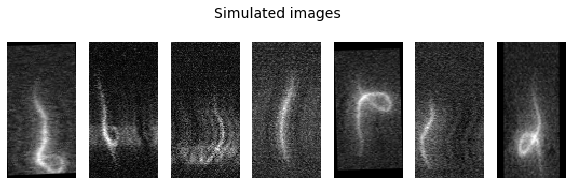

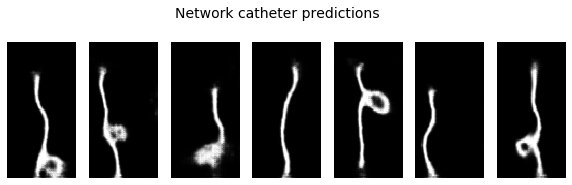

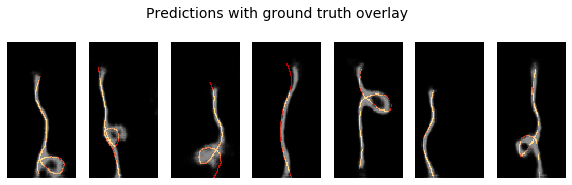

0m 22s
Epoch 41/99
----------
LR 0.005
Batch 0 : 0.02328384667634964
Batch 10 : 0.02494164928793907
Batch 20 : 0.021585999056696892
Batch 30 : 0.023219162598252296
Loss train : 0.02342591
Batch 0 : 0.02536686137318611
Loss val : 0.02454400


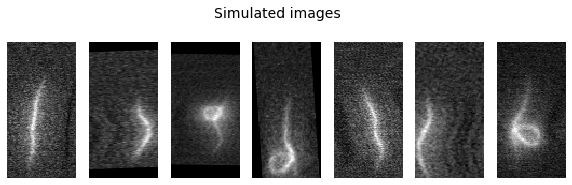

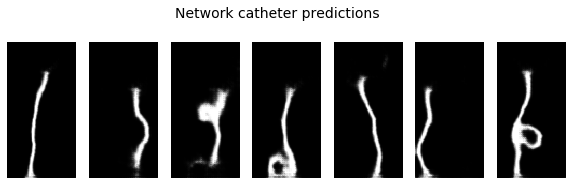

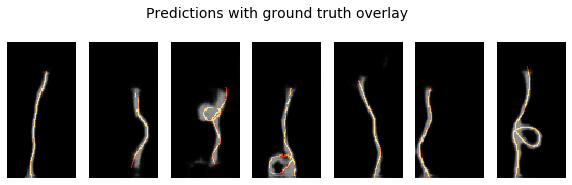

0m 21s
Epoch 42/99
----------
LR 0.005
Batch 0 : 0.023958615958690643
Batch 10 : 0.02106669917702675
Batch 20 : 0.02310306951403618
Batch 30 : 0.023006854578852654
Loss train : 0.02301602
Batch 0 : 0.02606227807700634
Loss val : 0.02438082


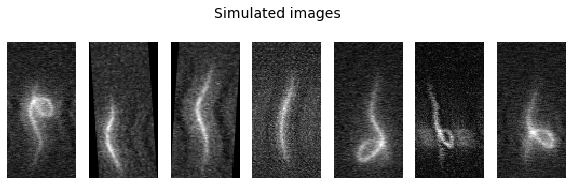

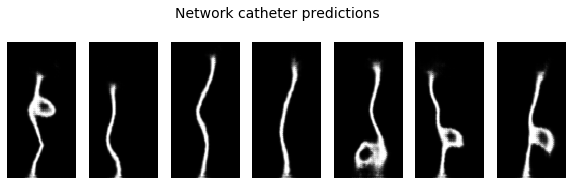

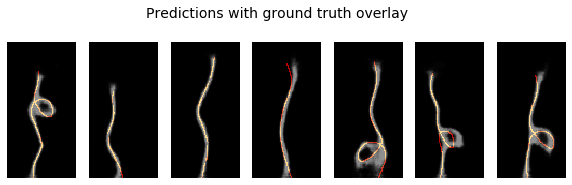

0m 23s
Epoch 43/99
----------
LR 0.005
Batch 0 : 0.021878795698285103
Batch 10 : 0.022435270249843597
Batch 20 : 0.024413716048002243
Batch 30 : 0.023690590634942055
Loss train : 0.02275461
Batch 0 : 0.024512913078069687
Loss val : 0.02381197


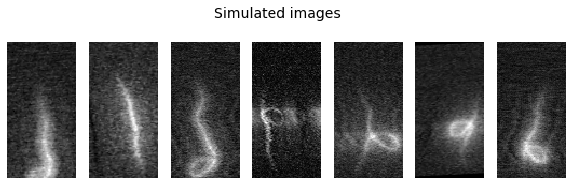

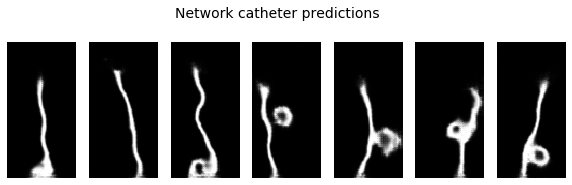

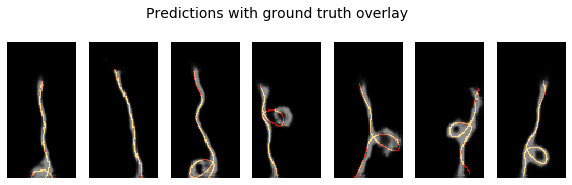

saving best model
0m 24s
Epoch 44/99
----------
LR 0.005
Batch 0 : 0.023432042449712753
Batch 10 : 0.02265145629644394
Batch 20 : 0.022236250340938568
Batch 30 : 0.023447180166840553
Loss train : 0.02282534
Batch 0 : 0.025513241067528725
Loss val : 0.02492917


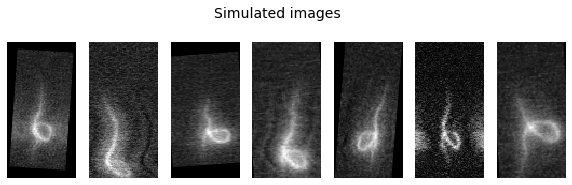

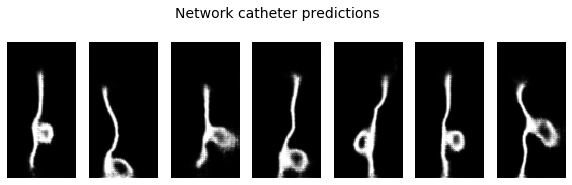

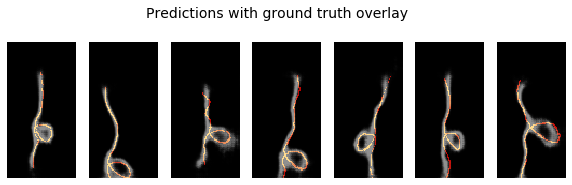

0m 23s
Epoch 45/99
----------
LR 0.005
Batch 0 : 0.023262882605195045
Batch 10 : 0.022954555228352547
Batch 20 : 0.022426361218094826
Batch 30 : 0.02313496544957161
Loss train : 0.02278372
Batch 0 : 0.025537509471178055
Loss val : 0.02436552


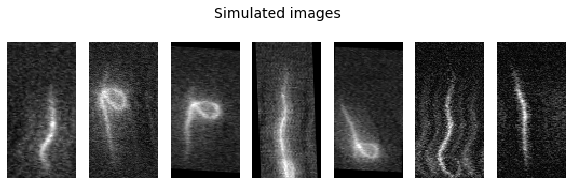

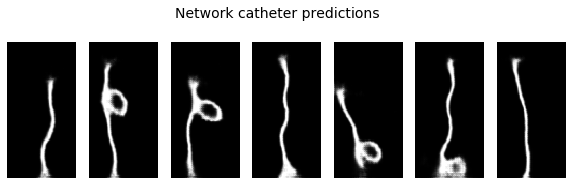

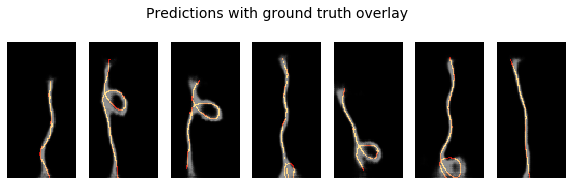

0m 22s
Epoch 46/99
----------
LR 0.005
Batch 0 : 0.022799281403422356
Batch 10 : 0.02271547168493271
Batch 20 : 0.02440778911113739
Batch 30 : 0.020919661968946457
Loss train : 0.02251344
Batch 0 : 0.023534120991826057
Loss val : 0.02351490


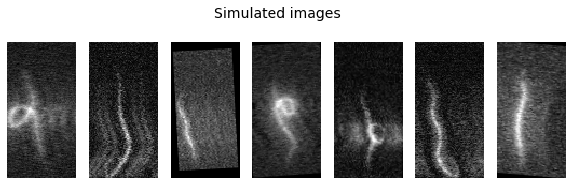

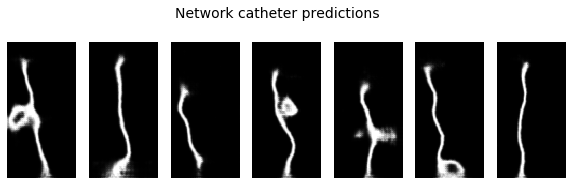

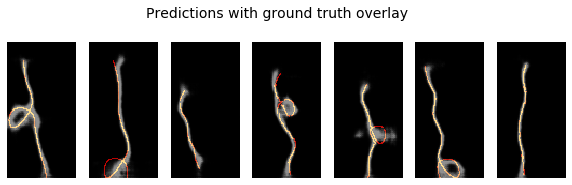

saving best model
0m 21s
Epoch 47/99
----------
LR 0.005
Batch 0 : 0.02236167900264263
Batch 10 : 0.02369607426226139
Batch 20 : 0.02107635699212551
Batch 30 : 0.022558223456144333
Loss train : 0.02253918
Batch 0 : 0.02321847900748253
Loss val : 0.02416234


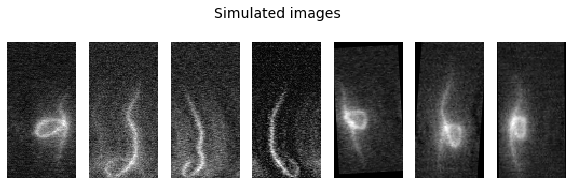

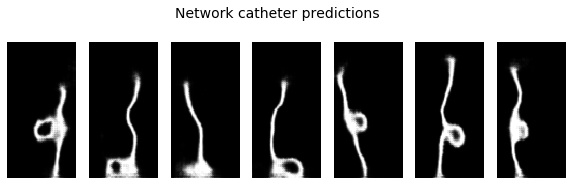

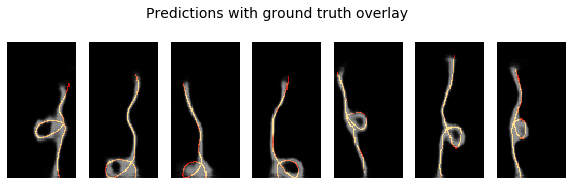

0m 20s
Epoch 48/99
----------
LR 0.005
Batch 0 : 0.022957267239689827
Batch 10 : 0.021674130111932755
Batch 20 : 0.02181403711438179
Batch 30 : 0.022600308060646057
Loss train : 0.02252393
Batch 0 : 0.02373601868748665
Loss val : 0.02377074


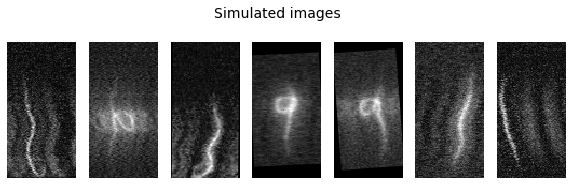

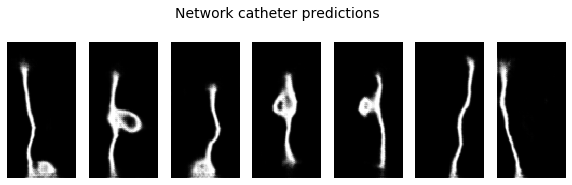

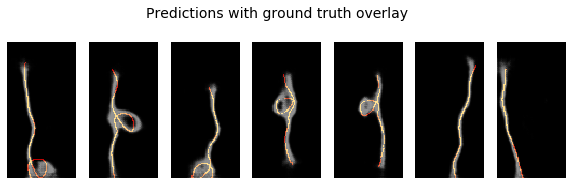

0m 20s
Epoch 49/99
----------
LR 0.005
Batch 0 : 0.02261194959282875
Batch 10 : 0.02359113283455372
Batch 20 : 0.02151414006948471
Batch 30 : 0.023170525208115578
Loss train : 0.02243485
Batch 0 : 0.0241005327552557
Loss val : 0.02386832


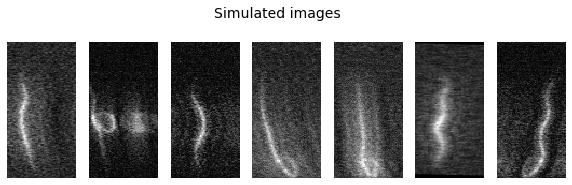

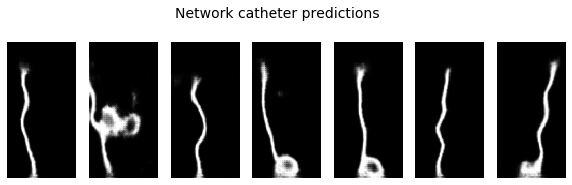

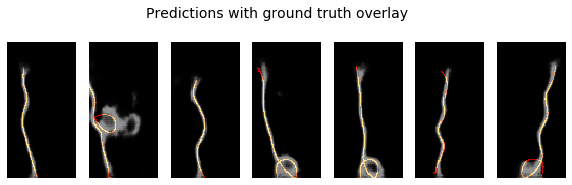

0m 21s
Epoch 50/99
----------
LR 0.005
Batch 0 : 0.022962555289268494
Batch 10 : 0.022001001983880997
Batch 20 : 0.024208564311265945
Batch 30 : 0.02194366417825222
Loss train : 0.02230190
Batch 0 : 0.023532340303063393
Loss val : 0.02367044


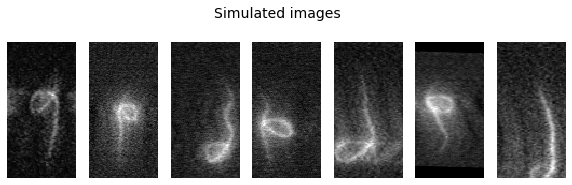

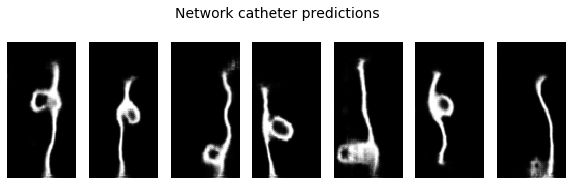

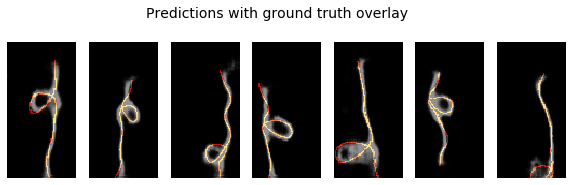

0m 21s
Epoch 51/99
----------
LR 0.005
Batch 0 : 0.022963058203458786
Batch 10 : 0.022328464314341545
Batch 20 : 0.02190685085952282
Batch 30 : 0.021952271461486816
Loss train : 0.02207642
Batch 0 : 0.024831676855683327
Loss val : 0.02392627


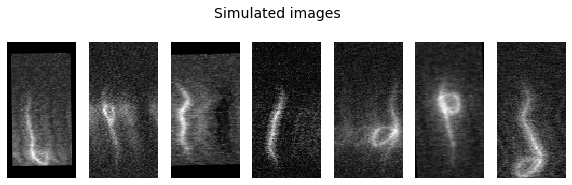

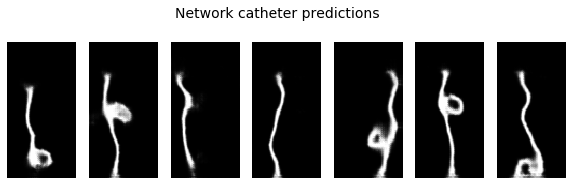

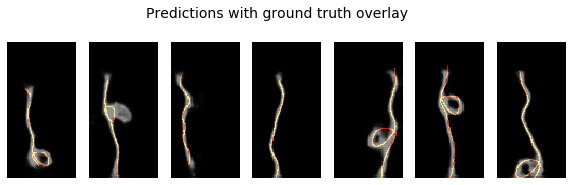

0m 20s
Epoch 52/99
----------
LR 0.005
Batch 0 : 0.02158203534781933
Batch 10 : 0.02350488491356373
Batch 20 : 0.02175586298108101
Batch 30 : 0.02285095863044262
Loss train : 0.02225258
Batch 0 : 0.02425205521285534
Loss val : 0.02346358


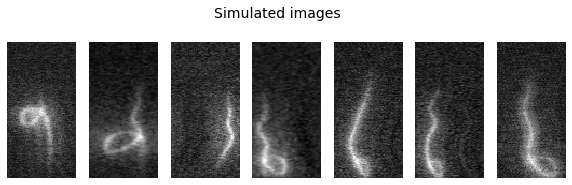

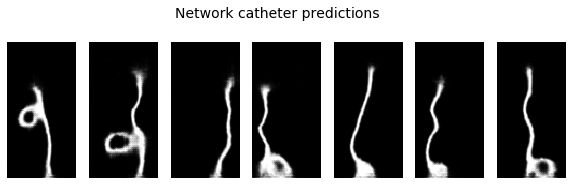

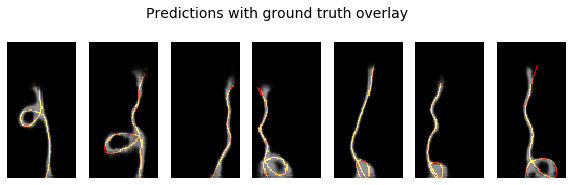

saving best model
0m 19s
Epoch 53/99
----------
LR 0.005
Batch 0 : 0.02192278392612934
Batch 10 : 0.022095469757914543
Batch 20 : 0.021754980087280273
Batch 30 : 0.02431403659284115
Loss train : 0.02195467
Batch 0 : 0.023137720301747322
Loss val : 0.02352466


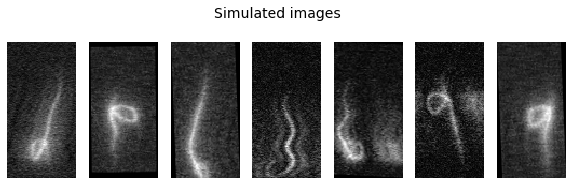

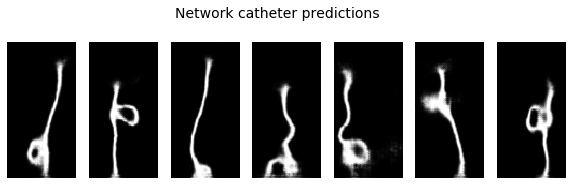

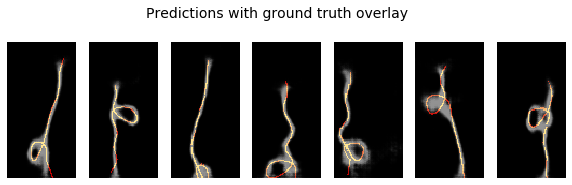

0m 19s
Epoch 54/99
----------
LR 0.005
Batch 0 : 0.022722970694303513
Batch 10 : 0.022653356194496155
Batch 20 : 0.020276298746466637
Batch 30 : 0.02082156576216221
Loss train : 0.02198084
Batch 0 : 0.023224949836730957
Loss val : 0.02332759


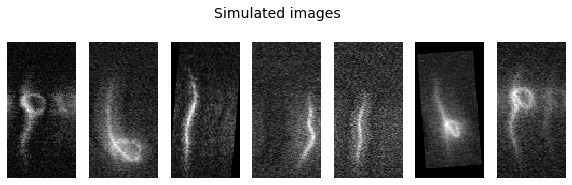

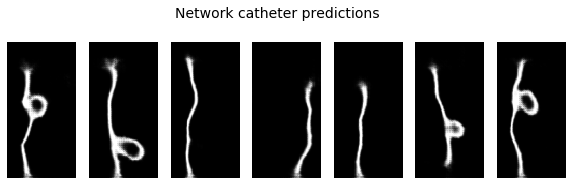

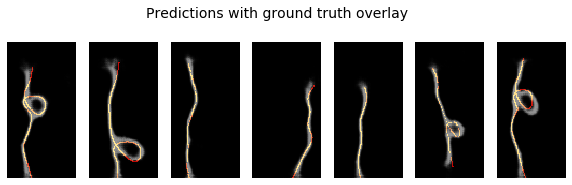

saving best model
0m 19s
Epoch 55/99
----------
LR 0.005
Batch 0 : 0.0220011118799448
Batch 10 : 0.021636011078953743
Batch 20 : 0.02077152580022812
Batch 30 : 0.022792646661400795
Loss train : 0.02192357
Batch 0 : 0.023890461772680283
Loss val : 0.02370030


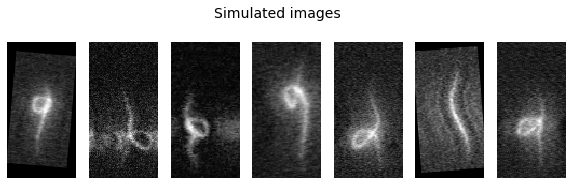

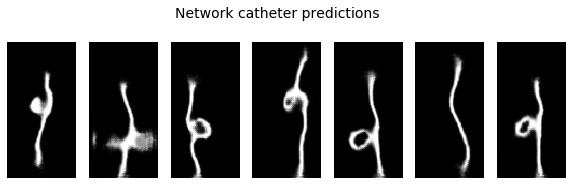

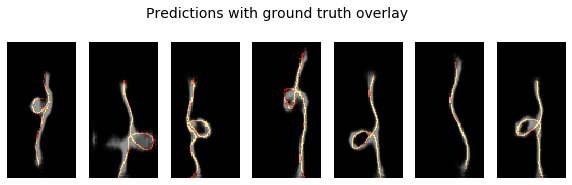

0m 19s
Epoch 56/99
----------
LR 0.005
Batch 0 : 0.023960238322615623
Batch 10 : 0.020977741107344627
Batch 20 : 0.022116107866168022
Batch 30 : 0.019923266023397446
Loss train : 0.02193307
Batch 0 : 0.02476738765835762
Loss val : 0.02366908


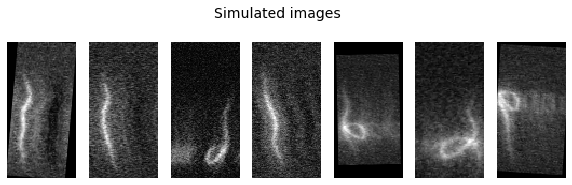

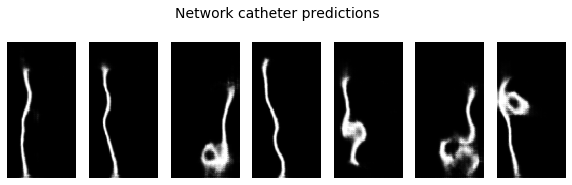

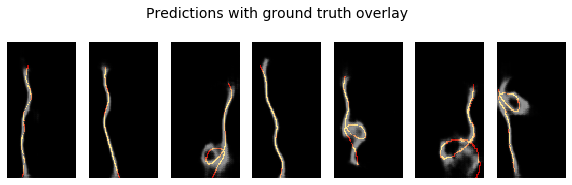

0m 20s
Epoch 57/99
----------
LR 0.005
Batch 0 : 0.02103276737034321
Batch 10 : 0.02033502422273159
Batch 20 : 0.021143417805433273
Batch 30 : 0.022651899605989456
Loss train : 0.02201368
Batch 0 : 0.02441355027258396
Loss val : 0.02277923


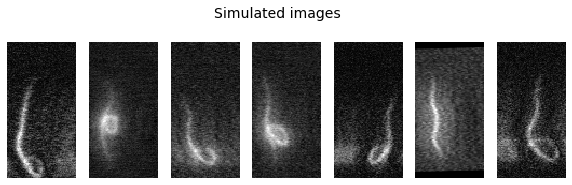

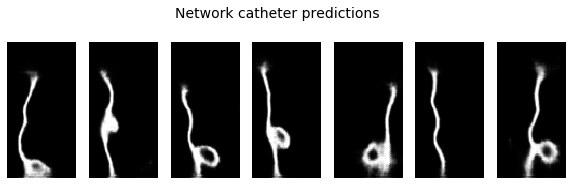

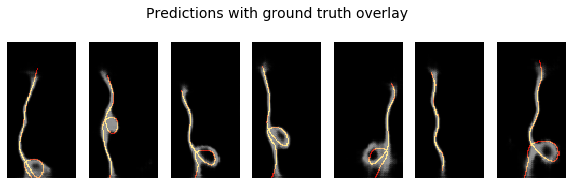

saving best model
0m 19s
Epoch 58/99
----------
LR 0.005
Batch 0 : 0.021247463300824165
Batch 10 : 0.021542539820075035
Batch 20 : 0.021987158805131912
Batch 30 : 0.022879695519804955
Loss train : 0.02146728
Batch 0 : 0.023752486333251
Loss val : 0.02295181


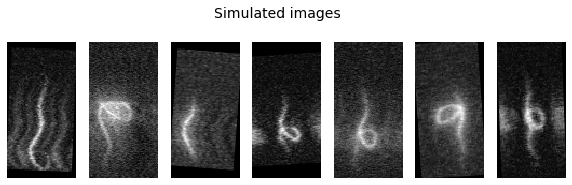

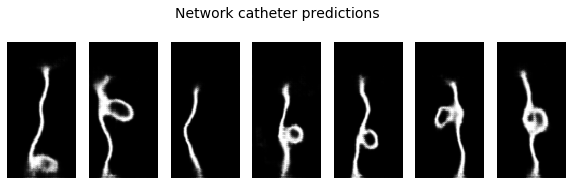

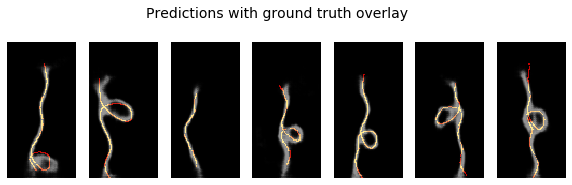

0m 19s
Epoch 59/99
----------
LR 0.005
Batch 0 : 0.02150907926261425
Batch 10 : 0.021419653668999672
Batch 20 : 0.022558247670531273
Batch 30 : 0.01988958567380905
Loss train : 0.02135386
Batch 0 : 0.02178051322698593
Loss val : 0.02288314


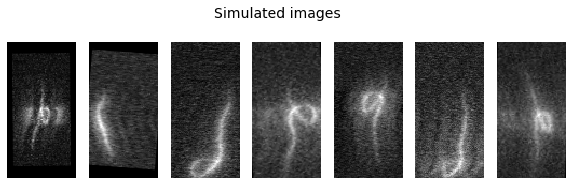

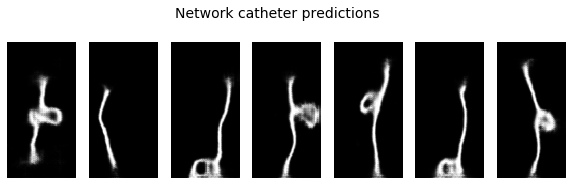

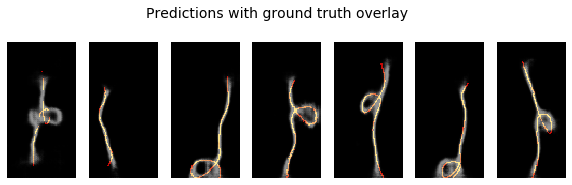

0m 20s
Epoch 60/99
----------
LR 0.005
Batch 0 : 0.021364936605095863
Batch 10 : 0.020589759573340416
Batch 20 : 0.021503925323486328
Batch 30 : 0.0202141385525465
Loss train : 0.02134958
Batch 0 : 0.024508096277713776
Loss val : 0.02323981


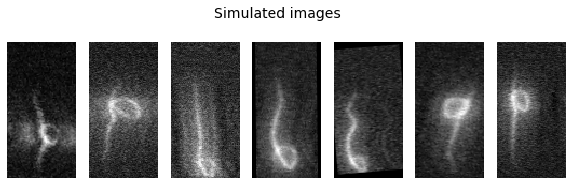

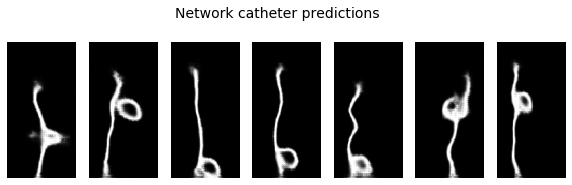

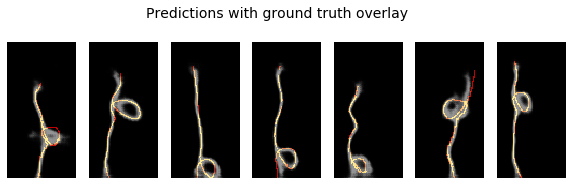

0m 20s
Epoch 61/99
----------
LR 0.005
Batch 0 : 0.021681971848011017
Batch 10 : 0.02145450748503208
Batch 20 : 0.021730566397309303
Batch 30 : 0.02095448039472103
Loss train : 0.02139902
Batch 0 : 0.024358663707971573
Loss val : 0.02323019


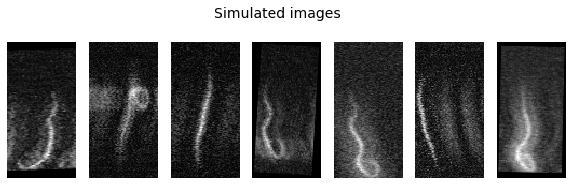

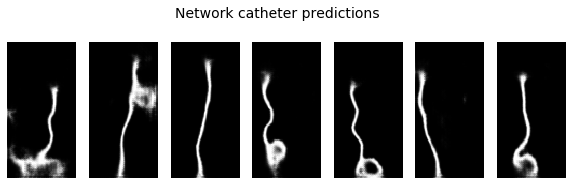

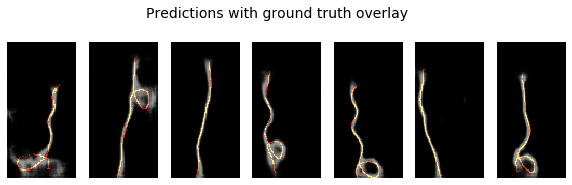

0m 20s
Epoch 62/99
----------
LR 0.005
Batch 0 : 0.0191819928586483
Batch 10 : 0.021080756559967995
Batch 20 : 0.02161092311143875
Batch 30 : 0.021026799455285072
Loss train : 0.02130269
Batch 0 : 0.02209911309182644
Loss val : 0.02289201


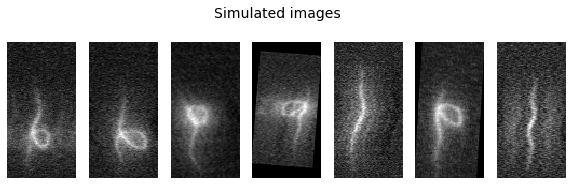

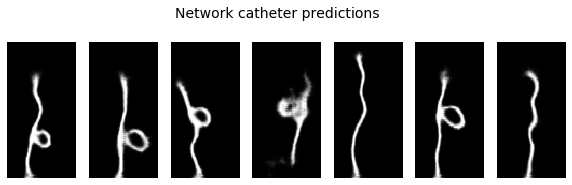

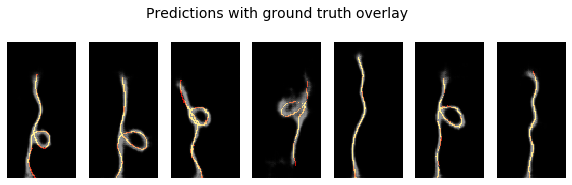

0m 20s
Epoch 63/99
----------
LR 0.005
Batch 0 : 0.020368823781609535
Batch 10 : 0.020294876769185066
Batch 20 : 0.020687872543931007
Batch 30 : 0.020458273589611053
Loss train : 0.02109192
Batch 0 : 0.02306359075009823
Loss val : 0.02315479


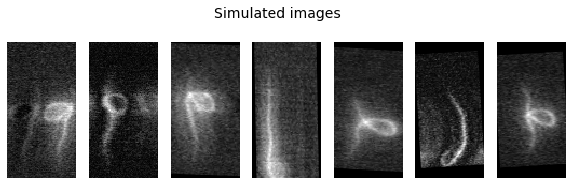

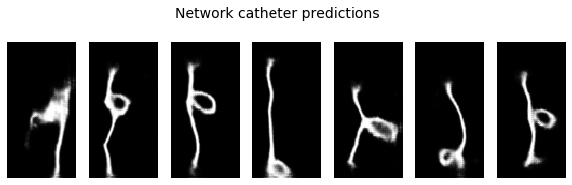

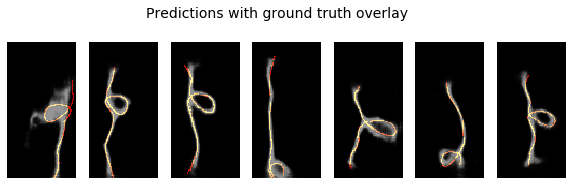

0m 19s
Epoch 64/99
----------
LR 0.005
Batch 0 : 0.022953135892748833
Batch 10 : 0.020359454676508904
Batch 20 : 0.021430430933833122
Batch 30 : 0.020250167697668076
Loss train : 0.02116710
Batch 0 : 0.023946551606059074
Loss val : 0.02314048


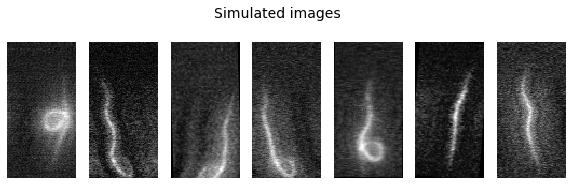

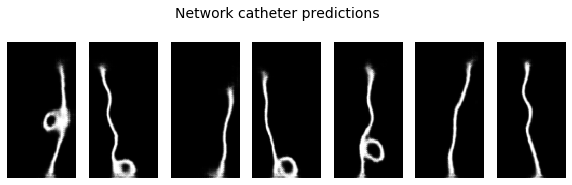

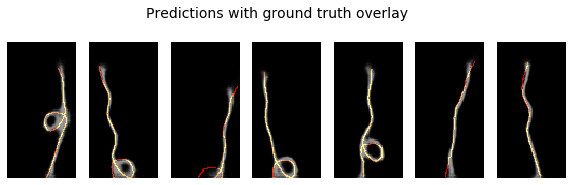

0m 19s
Epoch 65/99
----------
LR 0.005
Batch 0 : 0.02067888341844082
Batch 10 : 0.0209268257021904
Batch 20 : 0.021849583834409714
Batch 30 : 0.022014083340764046
Loss train : 0.02112507
Batch 0 : 0.022752273827791214
Loss val : 0.02294192


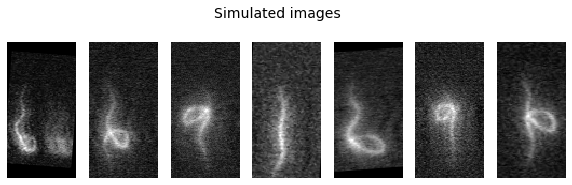

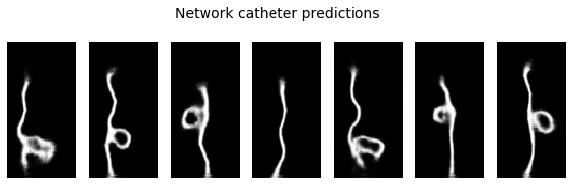

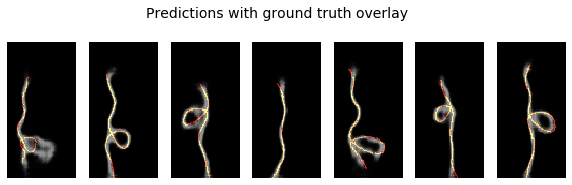

0m 20s
Epoch 66/99
----------
LR 0.005
Batch 0 : 0.02071722224354744
Batch 10 : 0.020393241196870804
Batch 20 : 0.022175507619976997
Batch 30 : 0.021391479298472404
Loss train : 0.02094844
Batch 0 : 0.02252710424363613
Loss val : 0.02318860


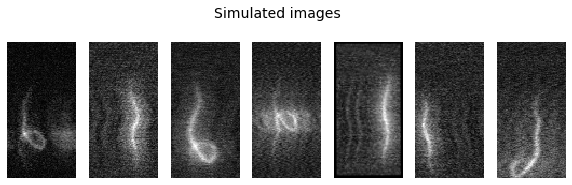

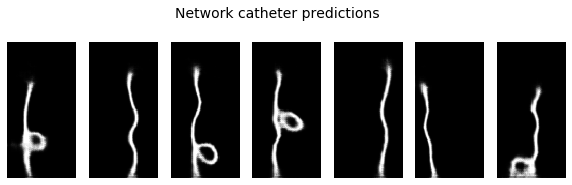

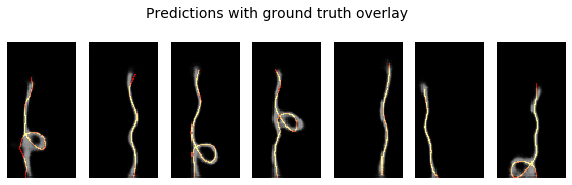

0m 19s
Epoch 67/99
----------
LR 0.005
Batch 0 : 0.020917238667607307
Batch 10 : 0.021399717777967453
Batch 20 : 0.02236621081829071
Batch 30 : 0.019918611273169518
Loss train : 0.02075089
Batch 0 : 0.022581936791539192
Loss val : 0.02257036


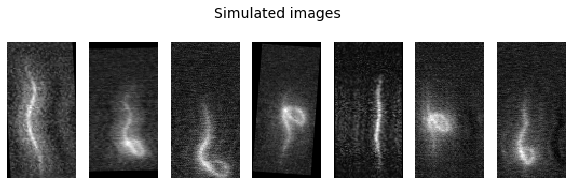

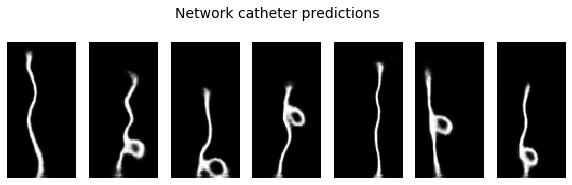

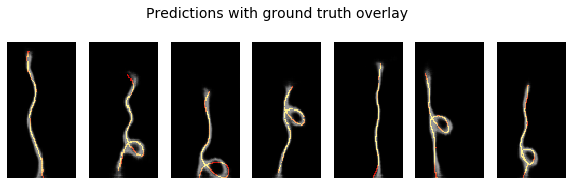

saving best model
0m 20s
Epoch 68/99
----------
LR 0.005
Batch 0 : 0.019917655736207962
Batch 10 : 0.02007165737450123
Batch 20 : 0.02038763277232647
Batch 30 : 0.02196023426949978
Loss train : 0.02071141
Batch 0 : 0.02285831980407238
Loss val : 0.02281481


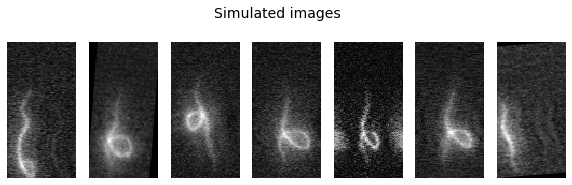

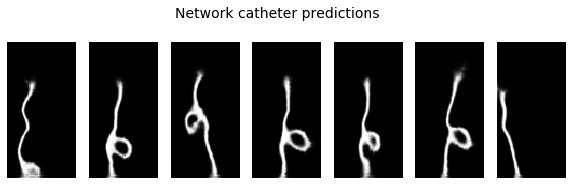

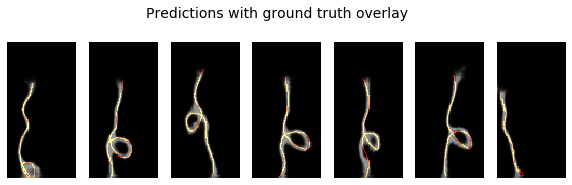

0m 21s
Epoch 69/99
----------
LR 0.005
Batch 0 : 0.01993652433156967
Batch 10 : 0.020128125324845314
Batch 20 : 0.021191716194152832
Batch 30 : 0.021101396530866623
Loss train : 0.02071952
Batch 0 : 0.02249077707529068
Loss val : 0.02286126


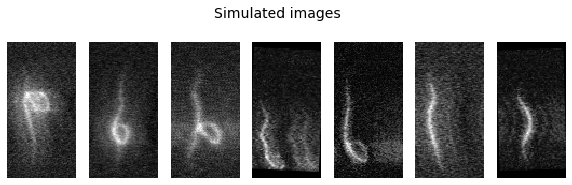

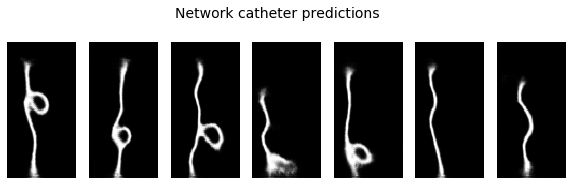

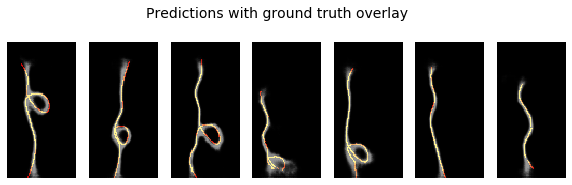

0m 20s
Epoch 70/99
----------
LR 0.005
Batch 0 : 0.021061955019831657
Batch 10 : 0.022119907662272453
Batch 20 : 0.02192211151123047
Batch 30 : 0.020767416805028915
Loss train : 0.02078764
Batch 0 : 0.022186217829585075
Loss val : 0.02255501


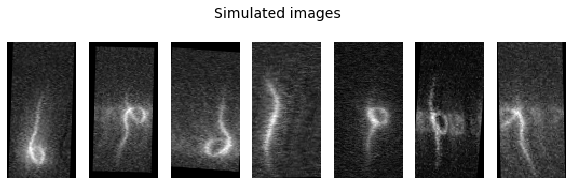

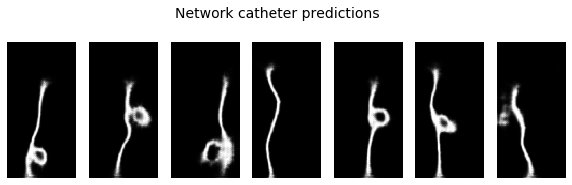

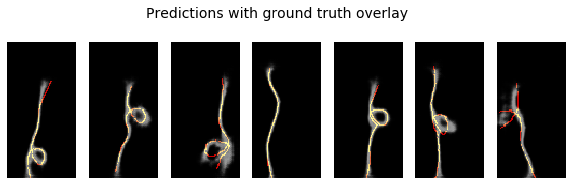

saving best model
0m 19s
Epoch 71/99
----------
LR 0.005
Batch 0 : 0.0199239794164896
Batch 10 : 0.020484257489442825
Batch 20 : 0.01976807788014412
Batch 30 : 0.021280815824866295
Loss train : 0.02057952
Batch 0 : 0.0221922155469656
Loss val : 0.02229389


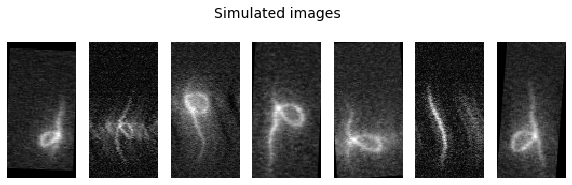

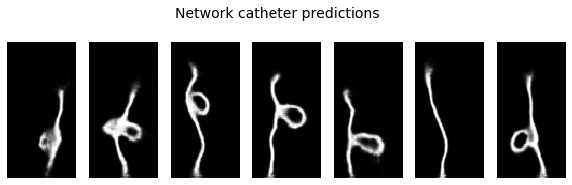

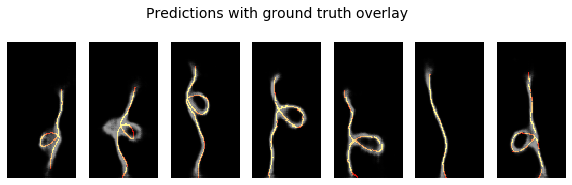

saving best model
0m 19s
Epoch 72/99
----------
LR 0.005
Batch 0 : 0.02138248272240162
Batch 10 : 0.020289968699216843
Batch 20 : 0.019221989437937737
Batch 30 : 0.021257741376757622
Loss train : 0.02051698
Batch 0 : 0.0214900691062212
Loss val : 0.02267619


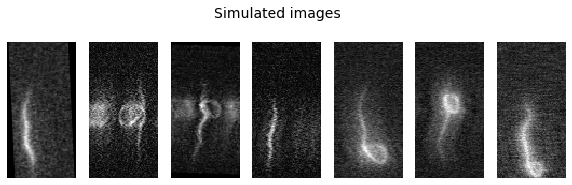

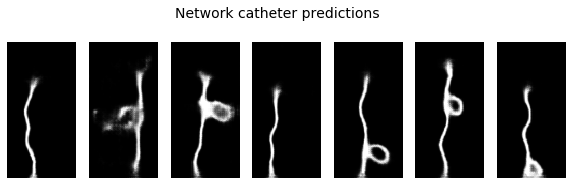

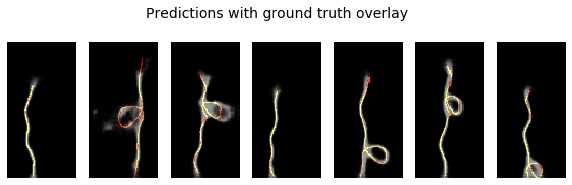

0m 19s
Epoch 73/99
----------
LR 0.005
Batch 0 : 0.02048431895673275
Batch 10 : 0.020857930183410645
Batch 20 : 0.02035023458302021
Batch 30 : 0.021595025435090065
Loss train : 0.02032329
Batch 0 : 0.02340691164135933
Loss val : 0.02250632


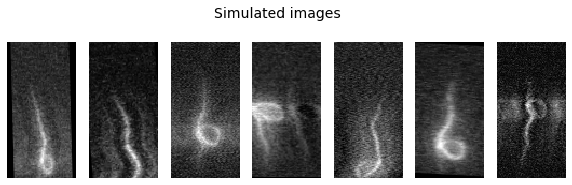

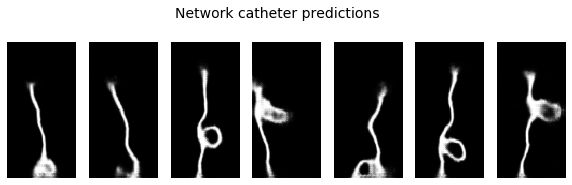

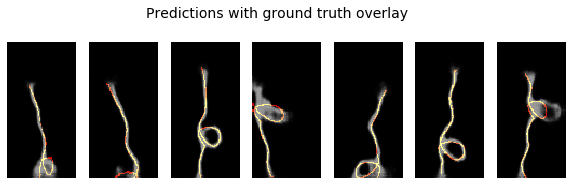

0m 19s
Epoch 74/99
----------
LR 0.005
Batch 0 : 0.021090757101774216
Batch 10 : 0.02034566178917885
Batch 20 : 0.020782575011253357
Batch 30 : 0.02047535963356495
Loss train : 0.02045717
Batch 0 : 0.021499838680028915
Loss val : 0.02254126


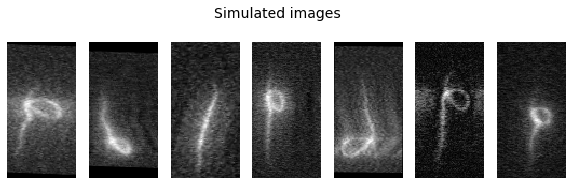

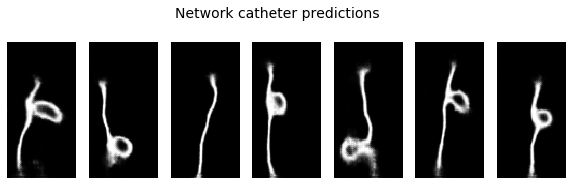

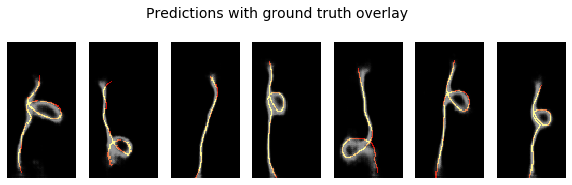

0m 20s
Epoch 75/99
----------
LR 0.005
Batch 0 : 0.020642688497900963
Batch 10 : 0.019658099859952927
Batch 20 : 0.02038590982556343
Batch 30 : 0.020092569291591644
Loss train : 0.02019965
Batch 0 : 0.020664827898144722
Loss val : 0.02243640


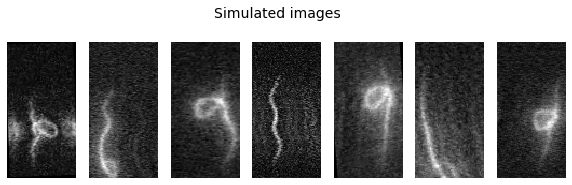

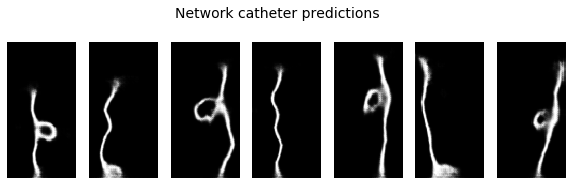

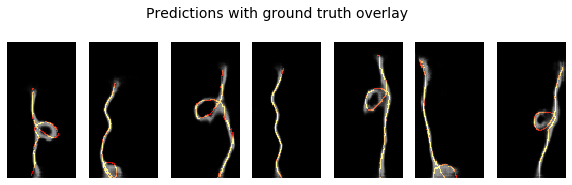

0m 19s
Epoch 76/99
----------
LR 0.005
Batch 0 : 0.02127533033490181
Batch 10 : 0.019797220826148987
Batch 20 : 0.02021179161965847
Batch 30 : 0.021847842261195183
Loss train : 0.02050045
Batch 0 : 0.021270502358675003
Loss val : 0.02214008


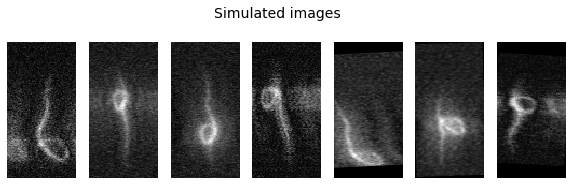

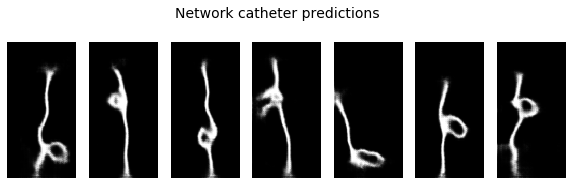

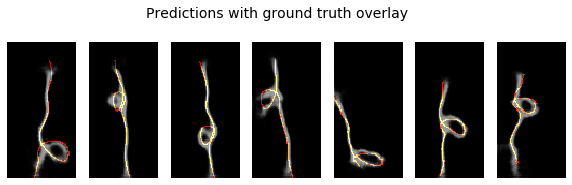

saving best model
0m 20s
Epoch 77/99
----------
LR 0.005
Batch 0 : 0.019645903259515762
Batch 10 : 0.019717639312148094
Batch 20 : 0.021302254870533943
Batch 30 : 0.020292920991778374
Loss train : 0.02042360
Batch 0 : 0.022532640025019646
Loss val : 0.02249110


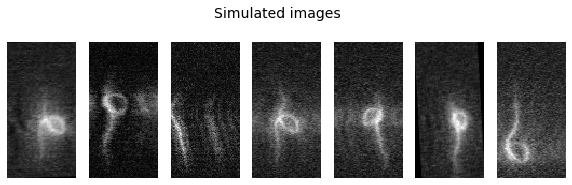

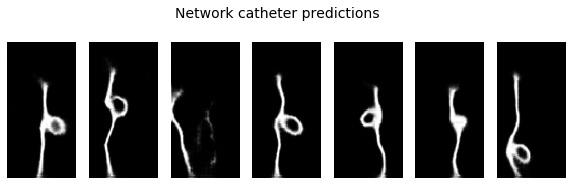

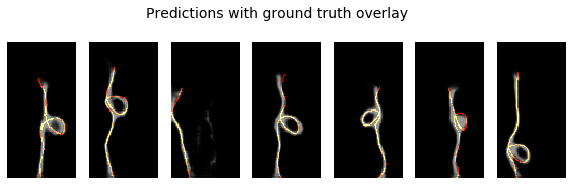

0m 19s
Epoch 78/99
----------
LR 0.005
Batch 0 : 0.019256973639130592
Batch 10 : 0.019583987072110176
Batch 20 : 0.01923980750143528
Batch 30 : 0.01975054293870926
Loss train : 0.02015494
Batch 0 : 0.023477904498577118
Loss val : 0.02261302


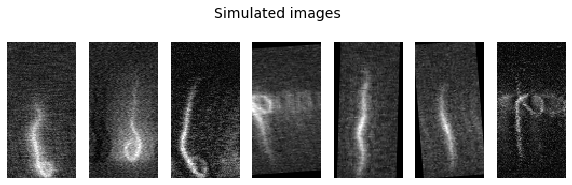

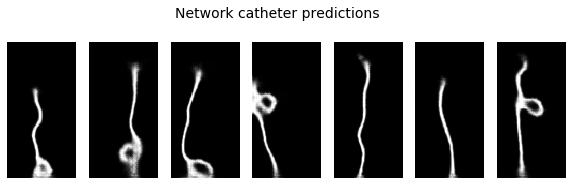

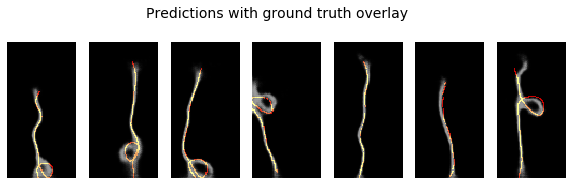

0m 20s
Epoch 79/99
----------
LR 0.005
Batch 0 : 0.019816605374217033
Batch 10 : 0.018436526879668236
Batch 20 : 0.02033230848610401
Batch 30 : 0.02056942880153656
Loss train : 0.02040326
Batch 0 : 0.023554768413305283
Loss val : 0.02328195


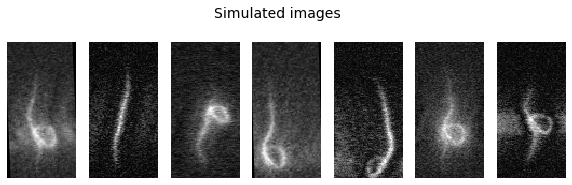

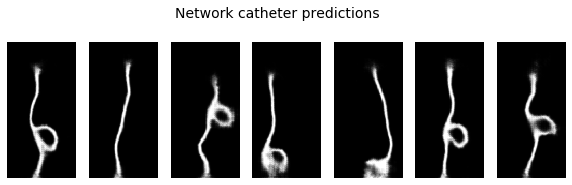

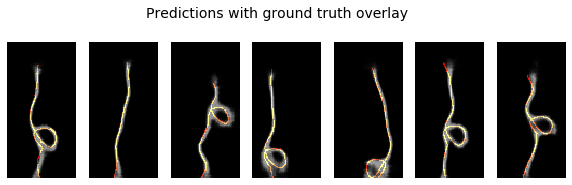

0m 20s
Epoch 80/99
----------
LR 0.005
Batch 0 : 0.0211036279797554
Batch 10 : 0.01937028579413891
Batch 20 : 0.021755661815404892
Batch 30 : 0.019190972670912743
Loss train : 0.02022922
Batch 0 : 0.022949445992708206
Loss val : 0.02218711


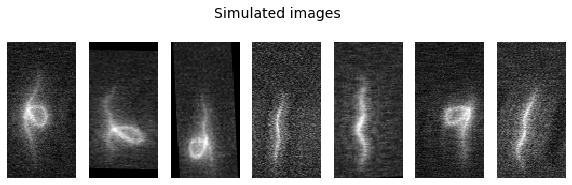

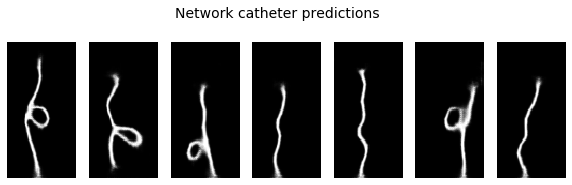

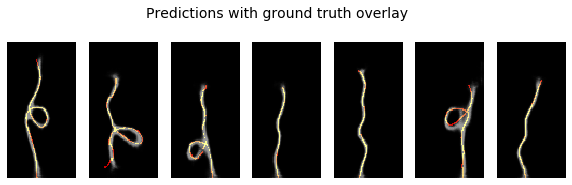

0m 22s
Epoch 81/99
----------
LR 0.005
Batch 0 : 0.019623151049017906
Batch 10 : 0.019557371735572815
Batch 20 : 0.018343916162848473
Batch 30 : 0.019436106085777283
Loss train : 0.02001448
Batch 0 : 0.02390671707689762
Loss val : 0.02234746


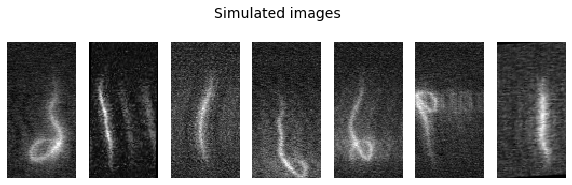

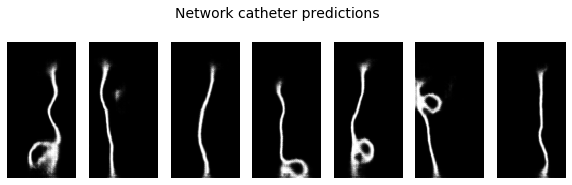

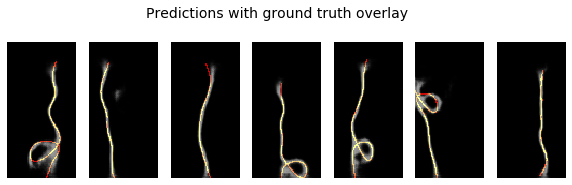

0m 22s
Epoch 82/99
----------
LR 0.005
Batch 0 : 0.019255589693784714
Batch 10 : 0.021399345248937607
Batch 20 : 0.020930804312229156
Batch 30 : 0.019540417939424515
Loss train : 0.02016817
Batch 0 : 0.021426523104310036
Loss val : 0.02205782


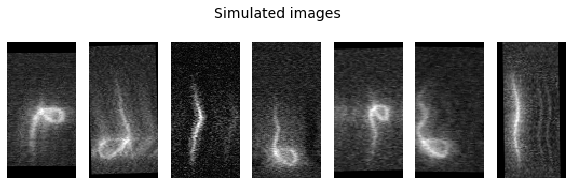

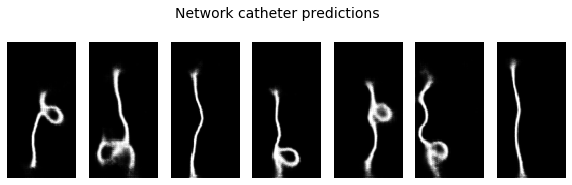

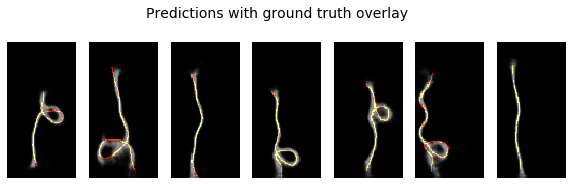

saving best model
0m 20s
Epoch 83/99
----------
LR 0.005
Batch 0 : 0.01855931244790554
Batch 10 : 0.019711624830961227
Batch 20 : 0.020011529326438904
Batch 30 : 0.019663989543914795
Loss train : 0.01991742
Batch 0 : 0.022650117054581642
Loss val : 0.02268492


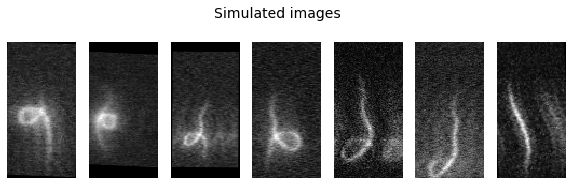

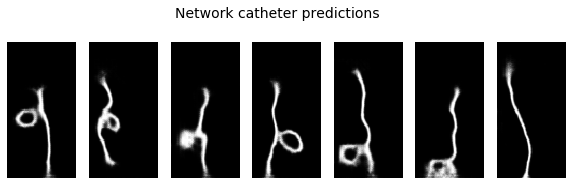

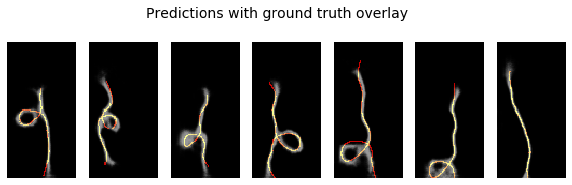

0m 22s
Epoch 84/99
----------
LR 0.005
Batch 0 : 0.01898273266851902
Batch 10 : 0.01898052915930748
Batch 20 : 0.01923231966793537
Batch 30 : 0.01921244151890278
Loss train : 0.01975797
Batch 0 : 0.020545318722724915
Loss val : 0.02211412


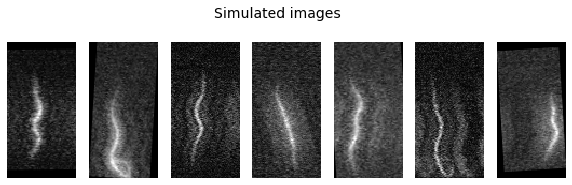

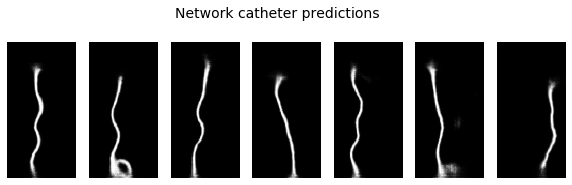

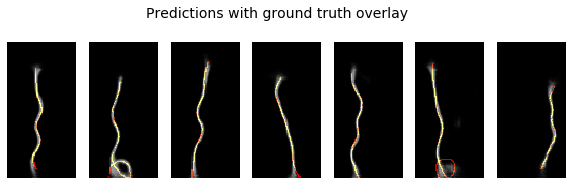

0m 21s
Epoch 85/99
----------
LR 0.005
Batch 0 : 0.019538940861821175
Batch 10 : 0.019506657496094704
Batch 20 : 0.019861534237861633
Batch 30 : 0.01949399709701538
Loss train : 0.01979780
Batch 0 : 0.020830603316426277
Loss val : 0.02204060


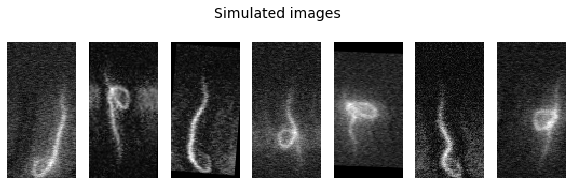

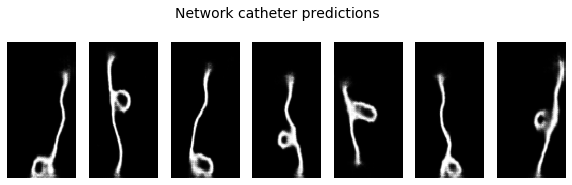

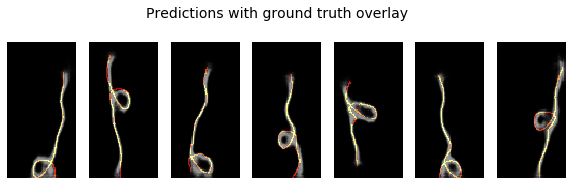

saving best model
0m 20s
Epoch 86/99
----------
LR 0.005
Batch 0 : 0.020305320620536804
Batch 10 : 0.018853679299354553
Batch 20 : 0.019943544641137123
Batch 30 : 0.019609952345490456
Loss train : 0.01972673
Batch 0 : 0.021073732525110245
Loss val : 0.02162400


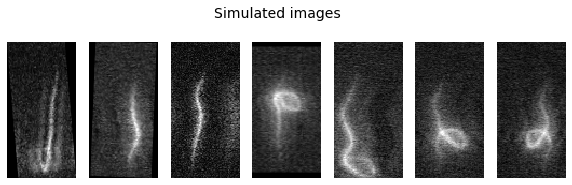

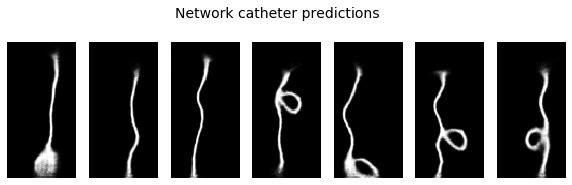

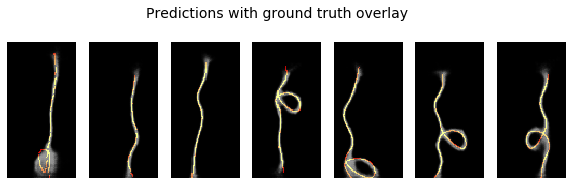

saving best model
0m 22s
Epoch 87/99
----------
LR 0.005
Batch 0 : 0.01933283358812332
Batch 10 : 0.02016359753906727
Batch 20 : 0.018559440970420837
Batch 30 : 0.02032354287803173
Loss train : 0.01975154
Batch 0 : 0.0204172283411026
Loss val : 0.02202208


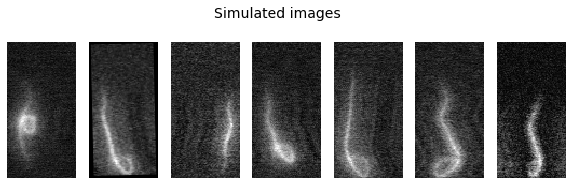

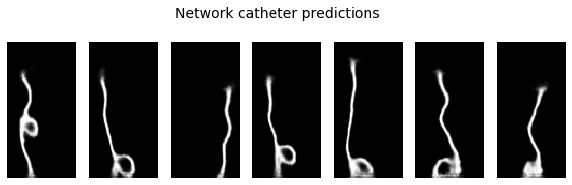

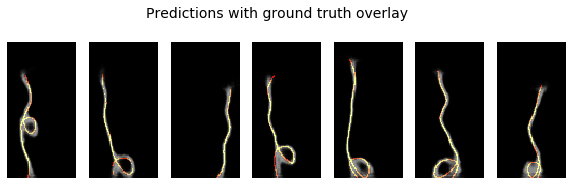

0m 20s
Epoch 88/99
----------
LR 0.005
Batch 0 : 0.02037493884563446
Batch 10 : 0.01964520290493965
Batch 20 : 0.019798673689365387
Batch 30 : 0.019937744364142418
Loss train : 0.01994573
Batch 0 : 0.021728403866291046
Loss val : 0.02203429


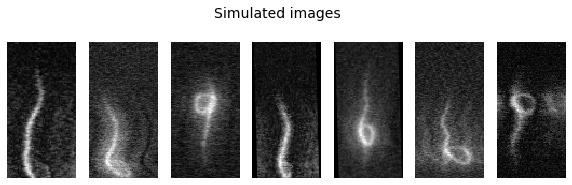

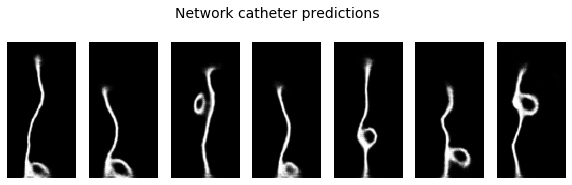

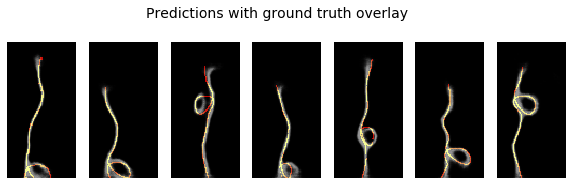

0m 31s
Epoch 89/99
----------
LR 0.005
Batch 0 : 0.01938551850616932
Batch 10 : 0.020523030310869217
Batch 20 : 0.02138606458902359
Batch 30 : 0.01894107460975647
Loss train : 0.01987089
Batch 0 : 0.020646972581744194
Loss val : 0.02195724


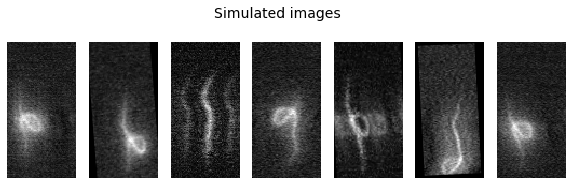

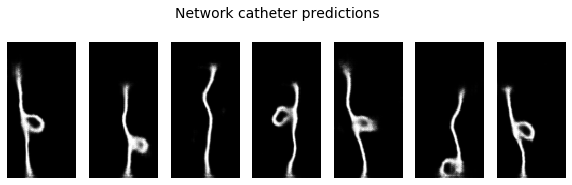

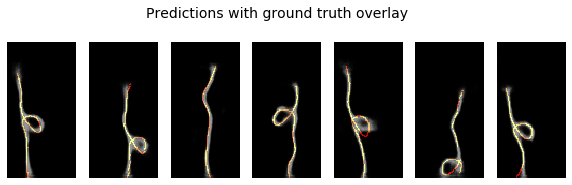

0m 26s
Epoch 90/99
----------
LR 0.005
Batch 0 : 0.01922055333852768
Batch 10 : 0.022031709551811218
Batch 20 : 0.01958499662578106
Batch 30 : 0.01947193779051304
Loss train : 0.01989095
Batch 0 : 0.02121809497475624
Loss val : 0.02221610


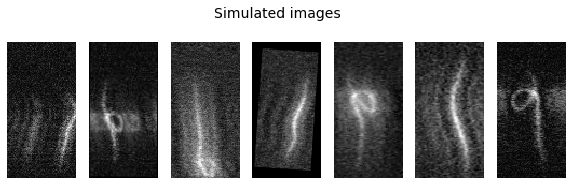

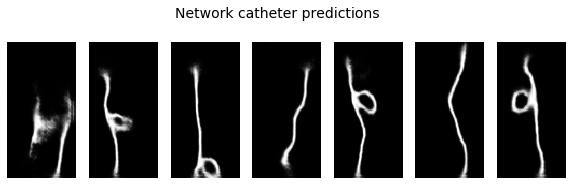

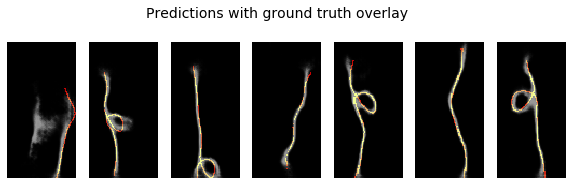

0m 24s
Epoch 91/99
----------
LR 0.005
Batch 0 : 0.020539971068501472
Batch 10 : 0.02006395347416401
Batch 20 : 0.020994994789361954
Batch 30 : 0.01880941167473793
Loss train : 0.01942109
Batch 0 : 0.0234433151781559
Loss val : 0.02189631


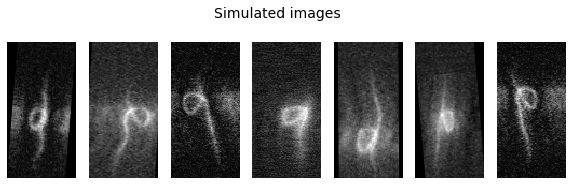

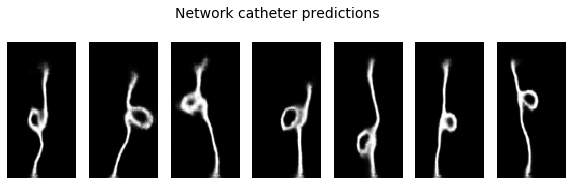

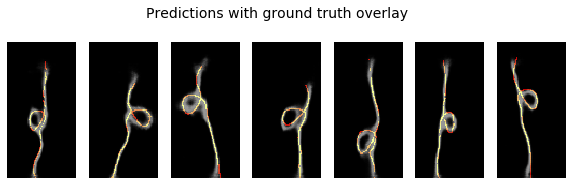

0m 22s
Epoch 92/99
----------
LR 0.005
Batch 0 : 0.019793158397078514
Batch 10 : 0.01885390095412731
Batch 20 : 0.020278997719287872
Batch 30 : 0.019603705033659935
Loss train : 0.01939833
Batch 0 : 0.023098088800907135
Loss val : 0.02157636


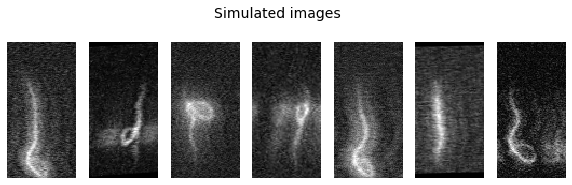

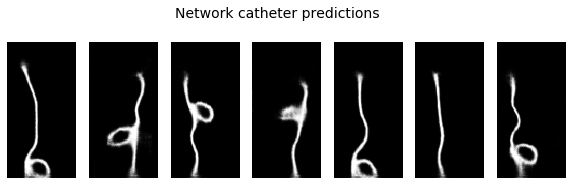

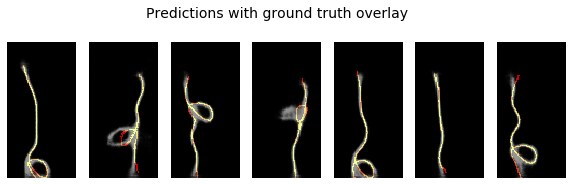

saving best model
0m 21s
Epoch 93/99
----------
LR 0.005
Batch 0 : 0.01990886777639389
Batch 10 : 0.01997925341129303
Batch 20 : 0.019963927567005157
Batch 30 : 0.020285356789827347
Loss train : 0.01952845
Batch 0 : 0.021105999127030373
Loss val : 0.02152948


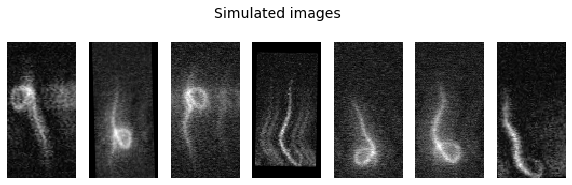

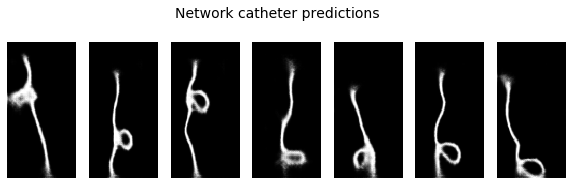

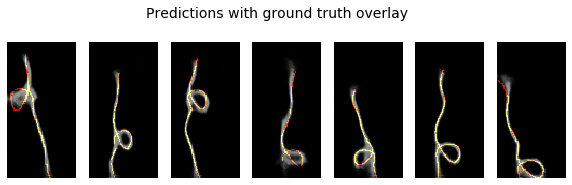

saving best model
0m 21s
Epoch 94/99
----------
LR 0.005
Batch 0 : 0.01961347460746765
Batch 10 : 0.01900819130241871
Batch 20 : 0.021193360909819603
Batch 30 : 0.018954385071992874
Loss train : 0.01961417
Batch 0 : 0.02142060361802578
Loss val : 0.02193125


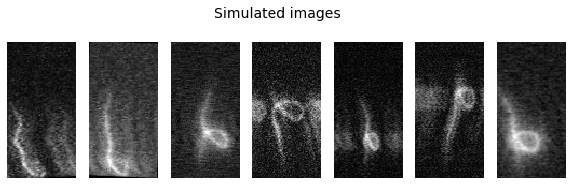

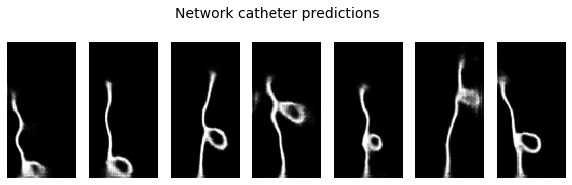

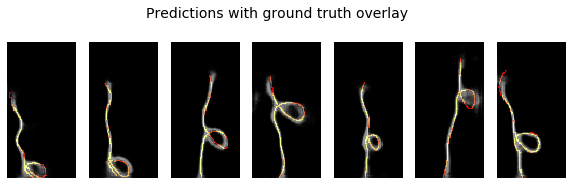

0m 21s
Epoch 95/99
----------
LR 0.005
Batch 0 : 0.019520409405231476
Batch 10 : 0.02105240523815155
Batch 20 : 0.019010920077562332
Batch 30 : 0.018064873293042183
Loss train : 0.01942659
Batch 0 : 0.021209528669714928
Loss val : 0.02163729


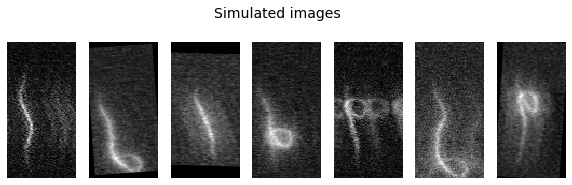

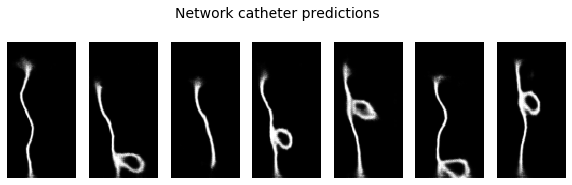

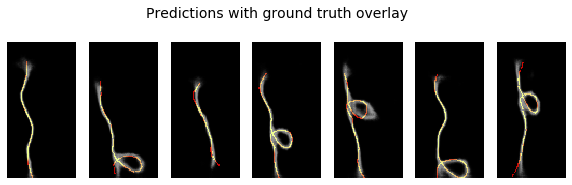

0m 22s
Epoch 96/99
----------
LR 0.005
Batch 0 : 0.020346369594335556
Batch 10 : 0.01946238800883293
Batch 20 : 0.019404958933591843
Batch 30 : 0.018693383783102036
Loss train : 0.01924934
Batch 0 : 0.022017693147063255
Loss val : 0.02208942


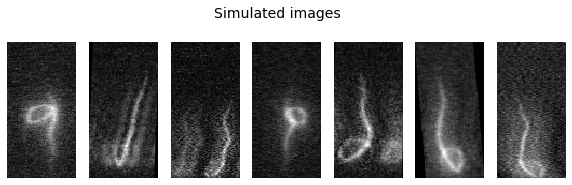

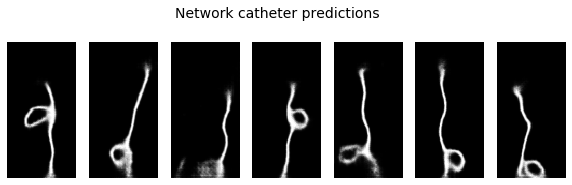

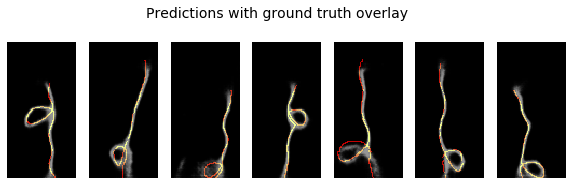

0m 27s
Epoch 97/99
----------
LR 0.005
Batch 0 : 0.019321555271744728
Batch 10 : 0.019587714225053787
Batch 20 : 0.020051272585988045
Batch 30 : 0.018642883747816086
Loss train : 0.01929500
Batch 0 : 0.022508595138788223
Loss val : 0.02201823


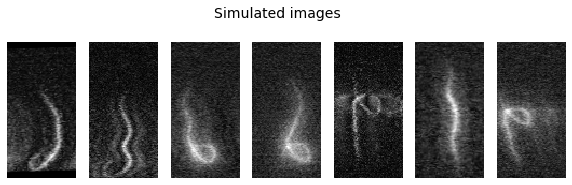

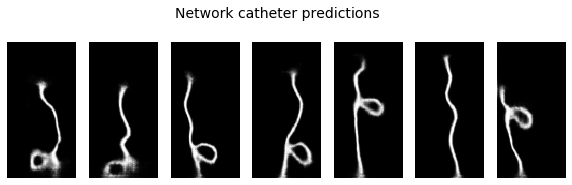

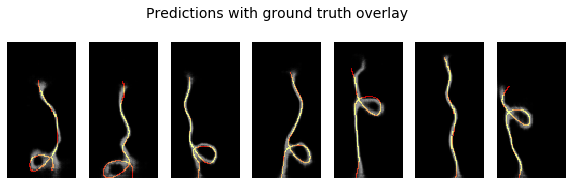

0m 33s
Epoch 98/99
----------
LR 0.005
Batch 0 : 0.019473878666758537
Batch 10 : 0.018844636157155037
Batch 20 : 0.018366031348705292
Batch 30 : 0.018405187875032425
Loss train : 0.01954386
Batch 0 : 0.021494286134839058
Loss val : 0.02164828


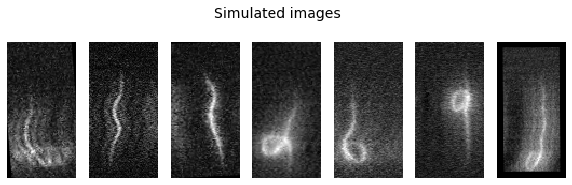

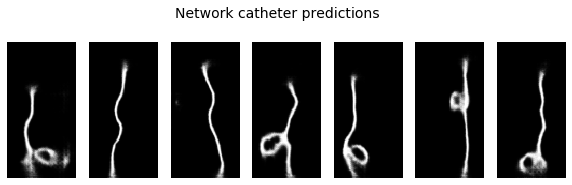

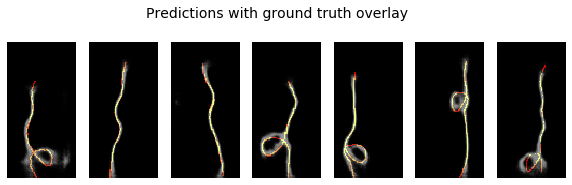

0m 30s
Epoch 99/99
----------
LR 0.005
Batch 0 : 0.019774556159973145
Batch 10 : 0.01929514855146408
Batch 20 : 0.020510340109467506
Batch 30 : 0.02101307362318039
Loss train : 0.01947373
Batch 0 : 0.022596079856157303
Loss val : 0.02181846


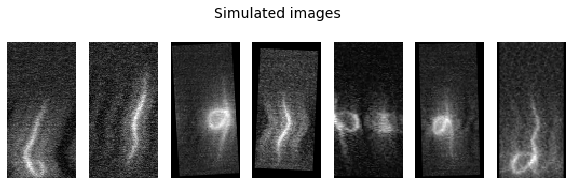

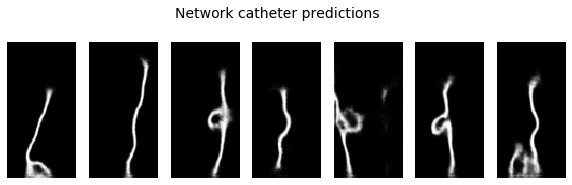

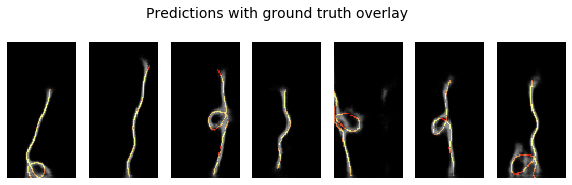

0m 21s
Best val loss: 0.021529


In [11]:
from collections import defaultdict
import torch.optim as optim
from torch.optim import lr_scheduler

import time
import copy

def train_model(model, optimizer, scheduler = None, num_epochs=25, train_stats_period=10):
    best_loss = 1e10

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        
        since = time.time()

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step() if scheduler is not None else None
                for param_group in optimizer.param_groups:
                    print("LR", param_group['lr'])
                    
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            epoch_samples = 0
            loss_vec = []

            for batch_id, (inputs, labels) in enumerate(dataloaders[phase]):
                [inputs,labels] = apply_augmentation(inputs,labels)
                inputs = inputs.to(device)
                labels = labels.to(device)   


                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs.float())

                    loss = loss_function(torch.squeeze(outputs), labels.type(torch.float32))

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
#                         print (loss.item())
                    loss_vec.append(loss.item())  

                    if batch_id % train_stats_period == 0:
                        print('Batch', batch_id, ':', loss.item())

                # statistics
                epoch_samples += inputs.size(0)

            # print loss at every epoch 
            epoch_loss = np.mean(np.asarray(loss_vec), dtype=np.float32)
            #epoch_loss = np.mean(np.asarray(loss_vec), dtype=np.float32)/float(epoch_samples)
            print('Loss ' + phase, ': {:.8f}'.format(epoch_loss))
            writer.add_scalar('Loss ' + phase, epoch_loss, epoch)

            if phase == 'val':
                visualise(inputs.squeeze(1).cpu().numpy(), 'Simulated images')
                preds = outputs.squeeze(1).cpu().numpy()

                visualise(preds, 'Network catheter predictions')
                colour_outputs = outputs.repeat(1, 3, 1, 1).permute(0, 2, 3, 1).cpu().numpy()
                colour_outputs = norm(colour_outputs)
                red_labels = np.zeros(colour_outputs.shape)
                red_labels[:,:,:,0] = labels.cpu() * torch.from_numpy(1.3 - preds)
                red_labels[:,:,:,1] = labels.cpu() * torch.from_numpy(preds)
                overlay = colour_outputs + red_labels
                overlay = norm(overlay)
                visualise(overlay, 'Predictions with ground truth overlay')
                
            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                print("saving best model")
                best_loss = epoch_loss
                torch.save(model.state_dict(), save_path)

        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val loss: {:4f}'.format(best_loss))

model = Segnet.SegNet(num_class).float()
model = model.to(device)

optimizer_ft = optim.SGD(model.parameters(), lr = 0.001, momentum=0.9) 
optimizer_ft=torch.optim.Adam(model.parameters(),0.005)

# exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=25, gamma=0.1)

train_model(model, optimizer_ft, num_epochs=100)

## Evaluate on <u>real</u> data

In [12]:
print(f'Loading {save_path}')
model.load_state_dict(torch.load(save_path))
model = model.to(device)
model.eval()

def infer(model, im):
    im = torch.Tensor(im).unsqueeze(0).unsqueeze(0).to(device)
    return model(im).squeeze(0).squeeze(0).cpu().detach().numpy()

print('Performance on real data')
import imageio
from PIL import Image
gif = imageio.get_reader('../data/cropped_gif.gif')
test_im = np.array(list(gif))[100]
test_im = np.array(Image.fromarray(test_im).resize([64, 128]))
test_im = norm(test_im)
# test_im = norm(np.array(Image.fromarray(test_im).resize([64, 128])))
plt.subplot(121)
show(test_im)
plt.title('Real acquisition')

# test_im = torch.Tensor(ims[0].float()).unsqueeze(0).to(device)
test_pred = infer(model, test_im)
plt.subplot(122)
show(test_pred)
plt.title('Predicted catheter \nsegmentation')
plt.show()

Loading saved_models/model_thin.pth
Performance on real data


FileNotFoundError: No such file: 'C:\Users\noonp\OneDrive\Desktop\Kings\Year 4\Group Project\New repo\AIWire\data\cropped_gif.gif'

### Testing skeletonisation

In [ ]:
print('Skeletonisation')
from skimage.morphology import skeletonize
ims = first_batch[0]
gts = first_batch[1].float()
output_folder = 'output'
print(ims.shape)

import imageio

for i in range(5):
    test_im = np.squeeze(ims[i]).float()

    plt.subplot(141)
    show(test_im)
    plt.title('Simulated\n image')

    plt.subplot(144)
    show(np.squeeze(gts[i]))
    plt.title('Ground truth')

    sim_pred = infer(model, test_im)
    plt.subplot(142)
    show(sim_pred > 0.5)
    plt.title('Predicted\n segmentation')

    skeleton = 255 * skeletonize(sim_pred > 0.5)
    plt.subplot(143)
    show(skeleton)
    plt.title('Skeletonised')
    imageio.imwrite(os.path.join(output_folder, f'skeletonised_{i}.png'), skeleton.astype(np.uint8))
    
    plt.show()